https://docs.anaconda.com/anaconda/user-guide/faq/
How do I cite Anaconda in an academic paper?

To cite Anaconda in an academic paper, use the recommended format. Example:

Anaconda Software Distribution. Computer software. Vers. 2-2.4.0. Anaconda, Nov. 2016. Web. <https://anaconda.com>.
« Cheat sheet

The following definitions are from Elements of Information Theory, 2nd ed. by Thomas M. Cover and Joy A. Thomas
The logarithsm are to base two unless otherwise indicated.
The probability of $X$ taking the value $x_i$ is denoted by $p(x_i)$


Entropy H(X)

$-\sum_{i=1}^m p(x_i)log(p(x_i))$

Joint entropy H(X,Y)=H(Y,X)

$-\sum_{i=1}^m \sum_{j=1}^n p(x_i,y_j) log(p(x_i,y_j))$

Conditional entropy H(X|Y)
\begin{align*}
H(X|Y)&=-\sum_{i=1}^m \sum_{j=1}^n p(x_i,y_j) log(p(x_i|y_j)) \\
&=-\sum_{i=1}^m \sum_{j=1}^n p(x_i,y_j) log\left(p(x_i,y_j)/\rho(y_i)\right),
\end{align*}
where $\rho(y_i)$ is the marginal probability of $y_i$.

Relative entropy

$$
Mutual information I(X,Y)=I(Y,X)
$$

# %Entropy is the average self-information contained in a random variable (reference from Shannon?). Mutual information %is the information gained from one variable when another variable is observed. This can be interpreted as the %reduction in the number of binary questions needed to obtain the value of one variable after another vartiable has %been observed. E.g. suppose that your friend has three cards. Two of the cards are yellow and one is red. The yellow %card and one of the red cards has number one printed on one side and the other red card has number two printed on it. %Your friend chooses one card at random. How many questions do you need on average to guess the correct number and %color, when the you can with any one question ask either the color or the number?


%Initially you know, that the card is yellow with a marginal probability $\frac{1}{3}$ and has number one printed on -%it with a marginal probability of $\frac{2}{3}$

%Your first question could be "Is the card yellow?". If the answe Irrespective of whether the answer is "Yes" or "No", %you immediately know the color of the card. Your next question is then "Is the number 1 printed on the card?". Again, %if the answer is "Yes", you know the number on the card, and if the answer is "No" you also know the number on the %card.

{\bf On mutual-information}
Example 2.2.1 in the book on Information Theory and the 4x4 matrix: E.g., in that example mutual information $I(X,Y)$ btw. $X$ and $Y$ is equal to $\frac{3}{8}$. Thus, knowing the value of $Y$ reduces the number of questions required to know the value of $X$ by $\frac{3}{8}$. The entropy of $X$ is $H(X)=\frac{7}{4}$ and $H(Y)=2$. Thus, on average one needs $\frac{7}{8}$ guesses to get the value of $X$ alone. However, if one knows the value of $Y$, the average number of questions needed to obtain the value of $X$ is reduced to $\frac{11}{8}$. This is verified by calculatin the conditional entropy $H(X|Y)$, which is equal to $\frac{11}{8}$. (the units are bits here)


{\bf How to estimate entropy numerically?} (see https://github.com/gregversteeg/NPEET/ and the paper "Estimatin Mutual Informatio" from Kraskov et al., June 2004)
What is resolution-dependent mutual entropy? (mentioned in Krasko et al.) In any case, ULF and FESA data are assumed to be from continuous distributions.

In [1]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True}) #adjusts figure sizes automatically
plt.rcParams['figure.dpi'] = 300 #set plot dpi to 300
import numpy.random as ran
import scipy.stats as stats
from itertools import dropwhile
import entropy_estimators as ee
import os
import random
import datetime as dt

#Class for creating objects to handle data and calculate pdfs and mutual information
class My_MI:
    def __init__(self,ulff,dates,power,fesaf,Lshells,fluxes):
        #ULF data
        self.dates=dates
        self.power=power
        #FESA data
        self.Lshells=Lshells
        self.fluxes=fluxes
        self.energy=self._find_energy(fesaf)
        #filenames
        self.fesaname=fesaf
        self.ulfname=ulff
        self.energy=self._find_energy(fesaf)
        #average flux over L shells
        self.avg_flux=self._L_avg(fluxes,0)
        
        
    def _nbins(self,x):
    #Function to define the number of bins for functions _createpdf and _jointpdf
        iqr=stats.iqr(x)
        lx=len(x)
        if np.all(np.floor(x)==np.ceil(x)) and lx==1: #Check if the vector has only constant values
            bins=np.min(x)
        else:
            #bins=int(np.ceil(lx**(1/3))) #cube-root of number of data points
            #remove comments below to use Freedman-Doaconis instead
            xma=np.max(x)
            xmi=np.min(x)
            bins=((xma-xmi)*lx**(1/3))/(2*iqr)    #Freedman-Diaconis rule
            bins=int(np.ceil(bins))
            #import pdb; pdb.set_trace()
        return bins
    
    def bin_ind(self,x,mini,maxi,steps):
    #Return bin index of x
        step=(maxi-mini)/steps
        rem1=x-mini #Get remainder
        S1=np.floor(rem1/step) #Number of full steps from mini is the index of the respective bin
        S1=int(S1)
        if S1==steps: #Adress the maximum value in data and insert it into the largest bin
            S1=S1-1
        return S1 #Determine the bin to which the ii entry in x belongs to 
    
    
    def _N_bins(self,x):
    #Assign number of occurrences to each bin
        mini=np.min(x)
        maxi=np.max(x)
        steps=self._nbins(x)
        N=np.zeros(steps)
        for ii in range(len(x)):
            S=self.bin_ind(x[ii],mini,maxi,steps)
            N[S]=N[S]+1 #Increase the number of occurrences in the bin by 1
        return N #Return the vector containing the occurrences per bin
    
    def _createpdf(self,x,s=None,dname=None,xaxis=None,yaxis=None):
    #The function creates a probability density function of given data
    #based on the partition, which is the number of brackets
    #It is assumed that the data is a function of an underlying variable, e.g. time, 
    #and the data points are in increasing order of the underlying variable
    #Set minimum, maximum, stepsize and array for calculating number of occurrences of each bracket 
        #print("Calculating pdf")
        #import pdb; pdb.set_trace()
        lx=len(x)
        mini=np.min(x)
        maxi=np.max(x)
        partition=self._nbins(x)
        step=(maxi-mini)/partition
        if step==0:
            step=1 #Address vectors with constant values only
    
        N=self._N_bins(x)         
        #Normalize probabilities
        pdf=N/lx
            
        
        brackets=np.linspace(mini+step/2,maxi-step/2,num=partition) #For plotting only, set mid-point of each bin
        #REMOVE COMMENTS IF HISTOGRAM IS DESIRED
        #bracketslim=np.linspace(mini,maxi,num=partition+1) #"Walls" of the bins
        #fig=plt.figure()
        #ax=fig.gca()
        #ax.set_xticks(np.arange(mini,maxi,partition+1)) #Set vertical lines to illustrate brackets
        #ax.plot(brackets,N,'ro')
        #plt.title("Number of events per bracket")
        #plt.grid(True)
        #plt.show()
        
        if s==1:
            #Plot distribution
            plt.plot(brackets,pdf,'ro')
            text=str("Code created pdf from "+str(dname)+" data with "+str(partition)+" bins for "+str(len(x))+" data points")
            plt.title(text)
            yadd=1.1
            plt.ylim(min(pdf)*yadd,max(pdf)*yadd)
            plt.xlabel(xaxis)
            plt.ylabel(yaxis)
            plt.savefig(text+".pdf",format="pdf")
            plt.show()
    
        #print("The marginal pdf is")
        #print(pdf)
        return pdf
    
    def _find_energy(self,filen):
    #Returns the energy level given in a FESA file name
        begin=filen.find("MeV", 0, len(filen))
        end=filen.find("MeV", 0, len(filen))
        energy=filen[begin-3:begin]
        return energy
    
    def _jointpdf(self,x,y):
    #The function creates a joint probability density function of two given data sets.
    #Set minimum, maximum, stepsize and array for calculating number of occurrences of each bin 
        #print("Calculating joint pdf")
        mini1=np.min(x)
        maxi1=np.max(x)
        mini2=np.min(y)
        maxi2=np.max(y)
        part1=self._nbins(x) #partitions
        part2=self._nbins(y)
        step1=(maxi1-mini1)/part1
        step2=(maxi2-mini2)/part2
        lx=len(x)
        ly=len(y)
        if step1==0:
            step1=1 #Address vectors with constant values only
        if step2==0:
            step2=1 #Address vectors with constant values only
        bracs1=np.zeros(lx) #Bin indices for data1
        bracs2=np.zeros(ly) #Bin indices for data2
        pdf=np.zeros([part1,part2]) #Matrix for joint probabilities
    
        #Assign bin indices
        for ii in range(lx):
            bracs1[ii]=self.bin_ind(x[ii],mini1,maxi1,part1)
        for jj in range(ly):    
            bracs2[jj]=self.bin_ind(y[jj],mini2,maxi2,part2)
    
        #Populate pdf
        Total=0
        for ii in range(0,part1):
            test1=1*(bracs1==ii)
            for jj in range(0,part2):
                test2=1*(bracs2==jj)
                summa=np.sum(test1.dot(test2))
                Total=Total+summa
                #import pdb; pdb.set_trace()
                pdf[ii][jj]=summa
        pdf=pdf/Total #Normalize
        #print("The sum of the joint probabilities is equal to", np.sum(pdf))
        #print(pdf)
        return pdf
        
    def _mutualinfo(self,x,y):
    #Calculate the mutual information based on two given data sets
        pdfX=self._createpdf(x,0)
        pdfY=self._createpdf(y,0)
        pdfXY=self._jointpdf(x,y)
        I=0
        for ii in range(len(pdfX)):
            for jj in range(len(pdfY)):
                #Handle division by zero and other exceptions
                if (pdfX[ii]*pdfY[jj])==0 and pdfXY[ii][jj]>0:
                    I=100 #This is a convention, see "Elements of Infomation Theory" OR SET TO SOME LARGE FINITE NUMBER
                    return I
                elif (pdfX[ii]*pdfY[jj])==0 and pdfXY[ii][jj]==0:
                    In=0 #ibid.
                elif (pdfX[ii]*pdfY[jj])!=0 and pdfXY[ii][jj]==0:
                    In=0 #ibid.
                else:
                    In=pdfXY[ii][jj]*np.log2(pdfXY[ii][jj]/(pdfX[ii]*pdfY[jj]))
                I=I+In
        #print("Mutual info is equal to", I)
        return I
    
    
    def _t_offset(self,pwr,flux,t):
    #Function for creating time offset btw. power and e fluxes
    #Positive offset means that the power precedes the e flux
    #t is the number of 9 hour steps to be offset
        lp=len(pwr)
        lf=len(flux)
        if t>=0:
            off_pwr=pwr[0:lp-t]
            off_flux=flux[t:]
        if t<0:
            off_pwr=pwr[-t:]
            off_flux=flux[0:lp+t]
        #print("Power precedes flux by",t,"time steps")
        return off_pwr, off_flux, t

    def _remnans(self,ulf,fesa):
    #Takes in ULF and FESA data
    #Removes the "nan" values in the FESA data and returns two arrays, where the nans have been removed from 
    #the FESA data and the corresponding ULF values have also been removed, so that the time stamps stay
    #in on-to-one correspondence. Also prints the number of removed nans.
        nflx=[]
        nulf=[]
        for ii in range(len(fesa)):
            if fesa[ii]=="nan" or fesa[ii] is np.nan or fesa[ii] is float('nan') or np.isnan(fesa[ii]):
                continue
            else:
                nflx.append(np.float64(fesa[ii]))
                nulf.append(np.float64(ulf[ii]))
        #print("Removed",len(fesa)-len(nflx),"nans")
        return np.asarray(nulf),np.asarray(nflx)
    
    def _rembig(self,arr1,arr2,big):
    #Removes numbers numbers from an array and also, concatenates another array,
    #when certain numbers are used to denote missing values. TIme stamps stay untouched, i.e. "aligned"
    #It is assumed that arr2 contains the values to be removed
    #The removal is done based on absolute value.
        narr1=[]
        narr2=[]
        for ii in range(len(arr2)):
            if abs(arr2[ii])>=abs(big):
                continue
            else:
                narr1.append(np.float64(arr1[ii]))
                narr2.append(np.float64(arr2[ii]))
        print("Removed",len(arr2)-len(narr2),"'big' values")
        return np.asarray(narr1),np.asarray(narr2)
    
    def _big2nans(self,arr1,big):
    #Converts "big" values to Nans
        small=arr1
        larr1=len(arr1)
        for jj in range(larr1):
            if small[jj]=='nan' or small[jj] is np.nan or small[jj] is float('nan') or np.isnan(small[jj]):
                continue
            if small[jj]>=big:
                small[jj]=np.nan
        return small
    
    def _tremnans(self,ulf,flx,toff):
    #The function creates the desired time step offset in the ULF and FESA data
    #and then removes the nans values from the FESA data and also amends the ULF data accordingly.
        npwr,nflx,t=self._t_offset(ulf,flx,toff)
        npwr1,nflx1=self._remnans(npwr,nflx)
        nflx1,npwr1=self._remnans(nflx1,npwr1)
        return npwr1,nflx1,t
    
    def _L_avg(self,x,ax):
    #Average e fluxes over all L shells
        avg_flux=np.nanmean(x,axis=ax)
        return avg_flux
    
    def _mi_toff(self,x,y,tau,tstep,plot=None,save=None,ttl=None):
    #Calculate the mutual info for the desired time offsets
        #tstep=9 #Hard coded size of a single time step. The other functions use the number of steps, i.e. tausteps
        tausteps=np.linspace(-tau,tau,2*tau+1,dtype=np.int64)
        mi=np.empty(len(tausteps)) #Array to store mutual info
        corrs=np.empty([len(tausteps),2])
        toffs=np.empty(len(tausteps)) #Array to store time offsets
        
        for jj in range(len(tausteps)):
            nx,ny,tt=self._tremnans(x,y,tausteps[jj])
            #minflux=min(minflux,min(ny)) #Can be used, if minflux and pinpwr need to be checked
            #minpwr=min(minpwr,min(nx))
            mi[jj]=self._mutualinfo(nx,ny)
            corrs[jj]=stats.pearsonr(nx,ny)
            toffs[jj]=tt*tstep
            #print(mi1)
            
        #Calculate noise
        noise=[]
        noisesig=[]
        noisevar=[]
        runs=200
        for ii in range(len(tausteps)):
            nn,ns,nt=self._tremnans(x,y,tausteps[ii])
            nn,ns,nv=mi_shuffle(nn,ns,runs)
            noise.append(nn)
            noisesig.append(ns)
            noisevar.append(nv)    
        noise=np.asarray(noise)
        noisesig=np.asarray(noisesig)
        noisevar=np.asarray(noisevar)
        nsig=3
        
        if plot==1:
            #plot results
            plt.plot(toffs,mi,"bo",label=str("MI"))
            #plt.plot(toffs,corrs[:,0],"ko",label=str("Pearson correlation of original data"))
            #annot(toffs,corrs[:,0],corrs[:,1],"p") #Annotate p values to the correlations 
            plt.xlabel('time offset (h)')
            plt.ylabel('mutual information (bits)')
            #enrg=test.energy
            plt.title(ttl)
            #plot noise
            plt.plot(toffs,noise,label=str("noise w/ "+str(nsig)+" sigma conf. interval"),color='orange')
            plt.fill_between(toffs,noise-nsig*noisesig,noise+nsig*noisesig, color='y', alpha=.1)
            plt.legend(loc='right')
            
        if save==1:
            plt.savefig(ttl+".pdf",format="pdf")
        
        plt.show()
            
        return toffs,mi
    
    def _disc_entropy(self,x):
    #The function evaluates the entropy of a discrete variable x
        pdf=self._create_pdf(x)
        pdf=self._if_null_probability(pdf)
        entropy=-1*(pdf.dot(np.log2(pdf)))
        #import pdb; pdb.set_trace()
        #print("Entropy is equal to", H)
        return entropy
    
    def _disc_jointentropy(self,x,y):
    #The function evaluates H(X,Y) for discrete variables X and Y
        pdfX=self._create_pdf(x)
        pdfY=self._create_pdf(y)
        pdfXY=self._joint_pdf(x,y)
    
        H=0
        #import pdb; pdb.set_trace()
        for ii in range(len(pdfX)):
            for jj in range(len(pdfY)):
                #skip any zero probabilities
                if pdfXY[ii][jj]==0:
                    continue
                summa=(pdfXY[ii][jj]*np.log2(pdfXY[ii][jj]))
                H=H-summa
        return H

In [2]:
#Functions for reading in data, writing into file and saving figures
def new_comment(f,txt):
#Write txt as a comment line in an open file f
    _txt="#"+txt+"\n"
    f.write(_txt)
    
def is_comment(s):
    #function to check if a line starts with some character, here "#" for comment
    # return true if a line starts with #
    return s.startswith('#')

def readerULF(name):
#This function reads ULF data from a .txt file into an array
    file = open(name, 'r')
    fname=name
    arr1=[]
    arr2=[]
    np.set_printoptions(precision=16) #For checking manually that input data is not rounded
    
    for line in dropwhile(is_comment,file):
        pl=line.split()
        arr1.append(np.unicode_(pl[0]))
        arr2.append(np.float64(pl[1]))               
    #Create a record of the arrays
    rec=np.rec.fromarrays((arr1, arr2), names=('dates', 'power'))
    file.close()
    return rec,fname

def readerFESA(name):
#This function reads FESA data from a .txt file into an array
    file = open(name, 'r')
    fname=name
    arr1=[]
    arr2=[]
    np.set_printoptions(precision=16) #For checking manually that input data is not rounded
    
    for line in dropwhile(is_comment,file):
        pl=line.split()
        arr1.append(np.float32(pl[0])) #L bin
        arr2.append(np.float64(pl[1:]))#The row of flux values per time stampt for the respective L bin              
    file.close()
    arr1=np.asarray(arr1)
    arr2=np.asarray(arr2)
    return arr1, arr2, fname

def readerVIRBO(name):
#This function reads ViRBO data from a .txt file into an array
    file = open(name, 'r')
    fname=name
    arr1=[]
    arr2=[]
    arr3=[]
    arr4=[]
    arr5=[]
    arr6=[]
    arr7=[]
    arr8=[]
    arr9=[]
    arr10=[]
    arr11=[]
    arr12=[]
    np.set_printoptions(precision=16) #For checking manually that input data is not rounded
    
    for line in dropwhile(is_comment,file):
        pl=line.split()
        arr1.append(np.unicode_(pl[0]))
        arr2.append(np.int64(pl[1]))
        arr3.append(np.int64(pl[2]))
        arr4.append(np.int64(pl[3]))
        arr5.append(np.int64(pl[4]))
        arr6.append(np.int64(pl[5]))
        arr7.append(np.float64(pl[6]))
        arr8.append(np.float64(pl[7]))
        arr9.append(np.float64(pl[8]))
        arr10.append(np.float64(pl[9]))
        arr11.append(np.float64(pl[10]))
        arr12.append(np.float64(pl[11]))
    #Create a record of the arrays
    rec=np.rec.fromarrays((arr1, arr2,arr3,arr4,arr5,arr6,arr7,arr8,arr9,arr10,arr11,arr12),
                          names=('year', 'month','day','hour','min','sec','Tgeo','Sgeo','Rgeo','Tgr','Sgr','Rgr'))
    file.close()
    return rec,fname

def readerEFLUX(name):
#This function reads e flux data from a .txt file into an array. The data (Fe130 and Fe1p2)
#is described in of Borosky&Yakymenko 2017 in sections 2.2 and 2.3
    file = open(name, 'r')
    fname=name
    arr1=[]
    arr2=[]
    arr3=[]
    arr4=[]
    arr5=[]
    np.set_printoptions(precision=16) #For checking manually that input data is not rounded
    
    for line in dropwhile(is_comment,file):
        pl=line.split()
        arr1.append(np.int64(pl[0])) 
        arr2.append(np.int64(pl[1]))  
        arr3.append(np.int64(pl[2])) 
        arr4.append(np.float64(pl[3])) 
        arr5.append(np.float64(pl[4])) 
    #Create a record of the arrays
    rec=np.rec.fromarrays((arr1,arr2,arr3,arr4,arr5),
                          names=('year', 'doy','hour','Fe1p2','Fe130'))
    file.close()
    return rec, fname

def finder(name1):
#Finds the FESA energy range provided in the file name
    word1="MeV"
    lword1=len(word1)
    ind=name1.find(word1)
    res=name1[ind-3:ind+lword1]
    import pdb; pdb.set_trace()
    return res

def figstodir(fesafile):
    directory = "plots/FESA"+finder(fesafile).replace(".","_")   
    parent_dir = "/Users/mikkosavola/Documents/Opiskelu_HY/Kandidaatintutkielma" #Parent Directory path 
    path = os.path.join(parent_dir, directory)  # Path 
  
    try:
        os.makedirs(path) #Create directory
        print("Directory '% s' created" % directory) 
        return path
    except OSError as error:
        print("Folder",path,"exists already")
        return path
    
def transf_name(_ufunc):
    #Returns the "name" of a utility function ufunc when given str(ufunc) as input
        n_ufunc=str(_ufunc)
        begin=n_ufunc.find("<", 0, len(n_ufunc))
        end=n_ufunc.find(">", 0, len(n_ufunc))
        _name=n_ufunc[begin+8:end-1]
        return _name
    
def write_to_file(f,x):
#Writes vector x as lines into a file
    for ii in range(len(x)):
         f.write(str(x[ii])+"\n")
    print("Saved data into file")

def annot(xs,ys,zs,text):
    # zip joins x, y and z coordinates in triplets
    #xs and ys give the points to be annotated, zs contains the annortations and text is
    #the text to be added
    for x,y,z in zip(xs,ys,zs):
        label = str(text+" "+"{:.2f}".format(z))
        plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center
        
def shuffler(x):
#Shuffle the values of vectos x in random ordering
    lx=len(x)
    nx=random.sample(list(x),lx)
    return np.asarray(nx)

def hours_avg(arr1,hours):
#Calculates the time average of arr1, in chunks of hours. E.g. if arr1 is 1x20 and hours equals 5
#The averages calculated are arr1[0:5], arr1[5:10], arr1[10:15] and arr1[15:20].
#It is assumed that arr1's length is a multiple of step.
    N=int(len(arr1)/hours)
    if len(arr1)%hours != 0:
        print('The given array is not a multiple of the given step size.')
    else:
        narr=[]
        for ii in range(N):
            start=ii*hours
            end=(ii+1)*hours
            narr.append(np.nanmean(arr1[start:end]))
        return np.asarray(narr,dtype=np.float64)
    
def mi_shuffle(data1,data2,nruns):
    #To calculate the noise level using a shuffle test
    arrmi=np.empty(nruns)
    test=My_MI('dummy1',1,data1,'dummy2',1,data2)
    for ii in range(nruns):    
        dn1=shuffler(test.power)     
        arrmi[ii]=test._mutualinfo(dn1,data2)       
        #calculate average MI and variance for given correlatiohn
    avgmi=np.mean(arrmi,dtype=np.float64)
    varmi=np.var(arrmi,dtype=np.float64)
    sigmi=np.sqrt(varmi)
   
    return avgmi,sigmi,varmi

In [3]:
def my_entropy(prob):
#The function is assumed to receive arrays as input, but no validation is done
#The input must be a normalized single variable distribution
    nulls=1*prob==0 #List zero probabilites
    prob=prob+nulls #Assign "1" instead of zero probatility to yield zero from the log
    H=-1*(prob.dot(np.log2(prob)))
    #import pdb; pdb.set_trace()
    #print("Entropy is equal to", H)
    return H

def my_jointentropy(prob1,prob2,prob12):
#The function is assumed to receive arrays as input, but no validation is done
    #Verify that imnputs arae arrays and not lists
    #prob1 and prob2 are marginal probabilities and prob12 is the combined pointwise probability
    #prob1 corresponds to the rows in prob12 and prob2 corresponds to the columns, for indexing purposes
    #Note that in general prob12<>prob1*prob2
    prob1=np.asarray(prob1)
    prob2=np.asarray(prob2)
    prob12=np.asarray(prob12)
    H=0
    #import pdb; pdb.set_trace()
    for ii in range(len(prob1)):
        for jj in range(len(prob2)):
            #skip any zero probabilities
            if prob12[ii][jj]==0:
                continue
            summa=(prob12[ii][jj]*np.log2(prob12[ii][jj]))
            H=H-summa
    return H


In [28]:
#ABOVE ARE THE FUNCTIONS USED TO CREATE PDFS AND CALCULATE MUTUALL INFORMATION etc.

In [5]:
#DO NOT DELETE
#Example adapted from the book
rhox1=[1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4]
rhoy1=[1,1,1,1,2,2,3,3,4,4,4,4,4,4,4,4,1,1,2,2,2,2,3,3,1,2,3,3,1,2,3,3]
test=My_MI('n',1,rhox1,'n',1,rhoy1)
print(test._disc_entropy(test._createpdf(test.power)))
print((test._createpdf(test.fluxes)))
print(test._mutualinfo(test.power,test.power))
#jointpdf(rhox1,rhoy1)
#mutualinfo(rhox1,rhoy1)

> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
1.75
> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
2.0
> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) c
1.75


In [69]:
#DO NOT DELETE
#Continues the book example by creating the marginal probability distributions and evaluating their respective entropies
print(my_entropy(createpdf(21,rhox1)))
mutualinfo(20,rhox1,20,rhox1)
#THIS REPRODUCES THE RESULT that self-information is equal to entropy, when tested for rhox1 and the number
#of brackets is 4 or larger (tested for bracket numbers 4, 17, 20, 21 and 27)

NameError: name 'createpdf' is not defined

In [ ]:
#TEST entropy for distribution rhox1 with number of brackets from 4 to 1000
def testentropy(minim,maxim,dist):
    ii=minim
    vec=My_MI('dummy1',1,rhox1,'dummy1',1,rhoy1)
    test=0
    while ii<(maxim-minim+1):
        #import pdb; pdb.set_trace()
        ent=my_entropy(vec._createpdf(vec.power))
        if ent==1.75:
            test=test+1
        ii=ii+1
    return test
testentropy(4,1000,rhox1)
#For each of the tested number of brackets, 4 to 1000, the entropy is 1.75. This implies
#that at least in some cases the function createpdf has an upper limit, beyond which
#it gives the "correct distribution" if one exists, i.e. errors in entropy due to too small a number of
#brackets go to zero.

> <ipython-input-1-c090647fe988>(79)_nbins()
-> return bins
(Pdb) bins
4
(Pdb) xma
4
(Pdb) xmi
1


In [49]:
#In the above test, setting the partitions for MI to be the cuberoot of the number of data points makes the code
#created MI agree well with the analytical one, epsecially for n=10000 and n=10000. even n=1000 gives a decent 
#agreement for small enough rho^2

In [ ]:
#TEST
#Create two Gaussians and calculate their entropies and MI.
#Entropy should be effected by variance while MI should only be a function of correlation

In [ ]:
#Testing how the MI is calculated for ULF and 4.2 MeV FESA
#Preliminary analysis of ULF vs. 4.2 MeV FESA
def test_ULF_42MeV():
    bins42,fluxes42=readerFESA("Raw_data/eflux_90d/FESA_binned_eflux_4.2MeV_2015-03-17_90d.txt")
    power=readerULF("Raw_data/eflux_90d/ULF_wave_power_GOES15_2015-03-17_90d.txt")
    #print(len(power))
    #print(len(fluxes42[0]))

    prt=15
    #print("Entropy calculated using the function createpdf")
    #print(my_entropy(createpdf(prt,fluxes42[0])))
    #print("Entropy calculated using the data points as such")
    #print(my_entropy(fluxes42[0]/sum(fluxes42[0])))
    #mutualinfo(prt,fluxes42[0],prt,fluxes42[0])
    #print("Entropy calculated using the function createpdf")
    #print(my_entropy(createpdf(prt,power['power'])))
    #print("Entropy calculated using the data points as such")
    #print(my_entropy(power['power']/sum(power['power'])))
    #mutualinfo(prt,power['power'],prt,power['power'])
    mutualinfo(prt,np.log2(power['power']),prt,np.log2(fluxes42[0]))
    
    pdfpwr=createpdf(prt,power['power'])
    pdfflx=createpdf(prt,fluxes42[0])
    pdfjoint=jointpdf(prt,power['power'],prt,fluxes42[0])
    je=my_jointentropy(pdfpwr,pdfflx,pdfjoint)
    epwr=my_entropy(pdfpwr)
    eflux=my_entropy(pdfflx)
    mi=epwr+eflux-je
    print("Mutual info calculate using entropy and mutual entropy equals",mi)
test_ULF_42MeV()

In [ ]:
#BELOW ARE TESTS USING THE CODE FROM Greg Ver Steeg
#Own amendments to his code are listed below    

Ran first 2to3 entropy_estimators.py to use python's automatic refactoring tool. Received the message below and then manually addressed the required changes to the listed "print"-commands, i.e. added brackets to the arguments of each "print". Also changed the other lines, as prompted below.

 2to3  entropy_estimators.py                                                                                                                     2 ↵  296  13:25:29
RefactoringTool: Skipping optional fixer: buffer
RefactoringTool: Skipping optional fixer: idioms
RefactoringTool: Skipping optional fixer: set_literal
RefactoringTool: Skipping optional fixer: ws_comma
RefactoringTool: Refactored entropy_estimators.py
--- entropy_estimators.py	(original)
+++ entropy_estimators.py	(refactored)
@@ -25,7 +25,7 @@
   tree = ss.cKDTree(x)
   nn = [tree.query(point,k+1,p=float('inf'))[0][k] for point in x]
   const = digamma(N)-digamma(k) + d*log(2)
-  return (const + d*np.mean(map(log,nn)))/log(base)
+  return (const + d*np.mean(list(map(log,nn))))/log(base)
 
 def mi(x,y,k=3,base=2):
   """ Mutual information of x and y
@@ -78,7 +78,7 @@
   treep = ss.cKDTree(xp)
   nn = [tree.query(point,k+1,p=float('inf'))[0][k] for point in x]
   nnp = [treep.query(point,k,p=float('inf'))[0][k-1] for point in x]
-  return (const + d*np.mean(map(log,nnp))-d*np.mean(map(log,nn)))/log(base)
+  return (const + d*np.mean(list(map(log,nnp)))-d*np.mean(list(map(log,nn))))/log(base)
 
 #####DISCRETE ESTIMATORS
 def entropyd(sx,base=2):
@@ -91,20 +91,20 @@
   """ Discrete mutual information estimator
       Given a list of samples which can be any hashable object
   """
-  return -entropyd(zip(x,y))+entropyd(x)+entropyd(y)
+  return -entropyd(list(zip(x,y)))+entropyd(x)+entropyd(y)
 
 def cmidd(x,y,z):
   """ Discrete mutual information estimator
       Given a list of samples which can be any hashable object
   """
-  return entropyd(zip(y,z))+entropyd(zip(x,z))-entropyd(zip(x,y,z))-entropyd(z)
+  return entropyd(list(zip(y,z)))+entropyd(list(zip(x,z)))-entropyd(list(zip(x,y,z)))-entropyd(z)
 
 def hist(sx):
   #Histogram from list of samples
   d = dict()
   for s in sx:
     d[s] = d.get(s,0) + 1
-  return map(lambda z:float(z)/len(sx),d.values())
+  return [float(z)/len(sx) for z in list(d.values())]
 
 def entropyfromprobs(probs,base=2):
 #Turn a normalized list of probabilities of discrete outcomes into entropy (base 2)
@@ -136,7 +136,7 @@
       mi -= word_dict[yval]*entropy(xgiveny,k,base)
     else:
       if warning:
-        print "Warning, after conditioning, on y=",yval," insufficient data. Assuming maximal entropy in this case."
+        print("Warning, after conditioning, on y=",yval," insufficient data. Assuming maximal entropy in this case.")
       mi -= word_dict[yval]*overallentropy
   return mi #units already applied
 
@@ -186,4 +186,4 @@
   return [sum(sublist,[]) for sublist in zip(*args)]
 
 if __name__ == "__main__":
-  print "NPEET: Non-parametric entropy estimation toolbox. See readme.pdf for details on usage."
+  print("NPEET: Non-parametric entropy estimation toolbox. See readme.pdf for details on usage.")
RefactoringTool: Files that need to be modified:
RefactoringTool: entropy_estimators.py

In [15]:
#ABOVE IS THE MESSAGE RECEIVED WHEN 2to3 entropy_estimators.py WAS CALLED. THE CHANGES TO THE CODE
#WERE DONE MANUALLY.

In [17]:
#TEST
def my_test_ee():
    import entropy_estimators as ee
    #Need to make sure that 10^(-10) is small compared to actual data, since that is the noise
    #print(ee.entropyd(rhoy1))
    #print(ee.entropyd(rhox1))
    #print(ee.midd(rhox1,rhoy1))
    bins42,fluxes42=readerFESA("Raw_data/eflux_90d/FESA_binned_eflux_4.2MeV_2015-03-17_90d.txt")
    power=readerULF("Raw_data/eflux_90d/ULF_wave_power_GOES15_2015-03-17_90d.txt")
    pwr=ee.vectorize(power['power'])
    flx=ee.vectorize(fluxes42[0])
    print(ee.mi(pwr,flx))
    corr=scipy.stats.pearsonr(power['power'],fluxes42[0])
    print(corr)
my_test_ee()

0.022142655993092564
(-0.08832596642252578, 0.16992342190079152)


TO DO NEXT
Test the code from Ver Steeg with what I know and do the calculations we want. Look thjrough Ver Steegs code (compare against the algorithm presented in Kraskov et al.)
Log and log, log and as is, as is and log as is and as is


Test Ver Steeg’s code for Gaussian bi-variate distribution

In [63]:
#TESTING MY OWN CODE TO SEE WHETHER THE SQUARE OF A GAUSSIAN R.V. HAS MI WITH THE VARIABLE ITSELF
#Normalized Gaussian and the Gaussian of a square
def test_square_grv(n):
    mu = 0
    variance = 1
    sigma = np.sqrt(variance)
    #y1=stats.norm.pdf(x, mu, sigma)
    #plt.plot(x, y1)
    #plt.title("Gaussian of x")
    #plt.show()
    mi=[]
    corr=[]
    p=[]

    #y3= stats.poisson.ppf(x, 1000)
    #plt.plot(x,y3)
    #plt.title("Poisson of x")
    #plt.show()
    for ii in range(n):
        x = np.random.normal(mu, sigma, 10000) #MI below performs ok for <1000 data points
        y2=x**2
        test=My_MI('dummy1',1,x,'dummmy2',1,y2)
        mi.append(test._mutualinfo(test.power,test.fluxes))
        corr.append(stats.pearsonr(x, y2)[0])
        p.append(stats.pearsonr(x, y2)[1])
    print("Average MI over "+str(n)+" runs")
    print(np.mean(mi))
    print("Average correlation over "+str(n)+" runs")
    print(np.mean(corr))
    print("Max and min correlation")
    print(max(corr),min(corr))
    print("Max and min p values")
    print(max(p),min(p))
test_square_grv(200)



Average MI over 200 runs
3.34424995562
Average correlation over 200 runs
0.00305550650392
Max and min correlation
0.069029478066 -0.0528846743695
Max and min p values
0.984136304711 4.83532765942e-12


100  iterations


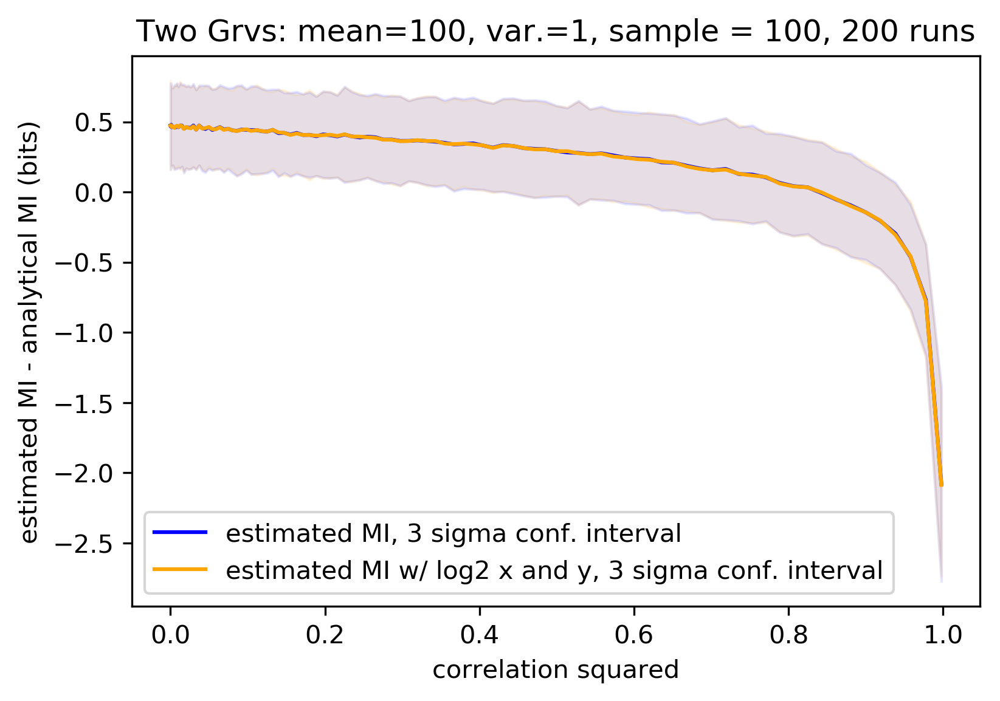

In [10]:
#TEST MY CODE: WHETHER A HOMEOMORPHISM CHANGES THE MUTUAL INFO OF TWO CORRELATED G.R.V.s; IT SHOULDN'T

def f_avg(y):
    avg=np.average(y)
    #vari=np.var(y)
    return avg

#Create two correlated Gaussian dstributions and evaluate their mutual info
#as a function of Pearson's correlation squared
def test_trans_my(_transf,smpl,N):
    from scipy.linalg import cholesky
    #Matrix of correlations
    corr=np.linspace(0.001,0.999,100)
    #Correlation matrix (actually covariance matrix but since correlations of single variables are set to 1,
    #covariance is equal to correlation) 
    os.chdir("/Users/mikkosavola/Documents/Opiskelu_HY/Kandidaatintutkielma") #Enforce the correct path
    
    #Number of data points
    pts=smpl
    #Values to store correlation and code calculated mutual info
    lcorr=len(corr)
    vals=np.empty([lcorr,5])
    valsan=np.empty([lcorr,2])
    relmi=np.empty([lcorr,4])
    N_rel=np.zeros([lcorr,4,N])
    tname=transf_name(_transf)
    
    mean=[100,100]
    print(len(corr)," iterations")
    for jj in range(N):
        for ii in range(len(corr)):
            ci=corr[ii]
            corr_mat= np.array([[1.0, ci],
                            [ci, 1.0,]])
            x,y=np.random.multivariate_normal(mean,corr_mat,pts).T
            check_negs(x) #Make sure that x and y are non-negative 
            check_negs(y)
            test2=My_MI("dummy1",1,x,"dummy2",2,y)
            I1=test2._mutualinfo(test2.power,test2.fluxes)
            I2=test2._mutualinfo(_transf(test2.power),test2.fluxes)
            I3=test2._mutualinfo(test2.power,_transf(test2.fluxes))
            I4=test2._mutualinfo(_transf(test2.power),_transf(test2.fluxes))
            vals[ii,:]=[ci**2,I1,I2,I3,I4]
            valsan[ii,:]=[ci**2,-0.5*np.log2(1-ci**2)]
            
            #For calculating relative MI, remove comments
            relmi[ii,:]=vals[ii,1:5]-valsan[ii,1]
            N_rel[ii,:,jj]=relmi[ii,:]
    avg_rel=np.nanmean(N_rel,2)
    var_mi=np.nanvar(N_rel,2)
    nsig=3
    sig0=np.sqrt(var_mi[:,0])
    sig1=np.sqrt(var_mi[:,1])
    sig2=np.sqrt(var_mi[:,2])
    sig3=np.sqrt(var_mi[:,3])
    
    #To plot relative values of MI w.r.t. analytical value, remove comments
    plt.plot(corr**2,avg_rel[:,0],label=str("estimated MI, "+str(nsig)+" sigma conf. interval"),color='blue') 
    plt.plot(corr**2,avg_rel[:,3],label=str("estimated MI w/ log2 x and y, "+str(nsig)+" sigma conf. interval"),color='orange')
    plt.fill_between(corr**2,avg_rel[:,0]-nsig*sig0,avg_rel[:,0]+nsig*sig0, color='b', alpha=.1)
    plt.fill_between(corr**2,avg_rel[:,3]-nsig*sig3,avg_rel[:,3]+nsig*sig3, color='orange', alpha=.1)
    plt.ylabel("estimated MI - analytical MI (bits)")

    
    #To plot absolute values, remove comments
    #plt.plot(corr,vals[:,1],label='Estimate')
    #plt.plot(corr,vals[:,2],label='Estimate w/ '+tname+' x')
    #plt.plot(corr,vals[:,3],label='Estimate w/ '+tname+' y')
    #plt.plot(corr,vals[:,4],label='Estimate w/ '+tname+' x and y' )
    #plt.plot(corr,valsan[:,1],label='Analytical result')
    #plt.ylabel("mutual information (bits)")
    
    
    _txt1="Two Grvs: mean="+str(mean[0])+", var.=1, sample = "+str(pts)+", "+str(N)+" runs"
    plt.title(_txt1) 
    plt.xlabel("correlation squared")
    plt.legend()
    figname="Sample_"+str(pts)+tname+"avg_over_"+str(N)+"runs"        
    plt.savefig(figname+".pdf",format="pdf")
    plt.show()
    

              
#TEST VER STEEG'S CODE: WHETHER A HOMEOMORPHISM CHANGES MUTUAL INFO; IT SHOULDN'T
#Create two correlated Gaussian dstributions and evaluate their mutual info
#as a function of Pearson's correlation quared
def test_trans_vs(_transf1,smpl1):
    from scipy.linalg import cholesky
    #Matrix of correlations
    corr=np.linspace(0.001,0.999,100)
    #Correlation matrix (actually covariance matrix but since correlations of single variables are set to 1,
    #covariance is equal to correlation)
    tname=transf_name(_transf1)
    
    os.chdir("/Users/mikkosavola/Documents/Opiskelu_HY/Kandidaatintutkielma") #Enforce the correct path
    
    #Number of data points
    pts=smpl1
    
    #Values to store correlation and code calculated mutual info
    vals=np.zeros([len(corr),5])
    valsan=np.zeros([len(corr),2])
    
    mean=[100,100]
    print(len(corr)," iterations")
    for ii in range(len(corr)):
        ci=corr[ii]
        corr_mat= np.array([[1.0, ci],
                        [ci, 1.0,]])
        x,y=np.random.multivariate_normal(mean,corr_mat,pts).T
        check_negs(x) #Make sure that x and y are non-negative 
        check_negs(y)
        #print(min(abs(x)))
        #print(min(abs(y)))
        I1=ee.mi(ee.vectorize(x),ee.vectorize(y))
        I2=ee.mi(ee.vectorize(_transf1(x)),ee.vectorize(y))
        I3=ee.mi(ee.vectorize(x),ee.vectorize(_transf1(y)))
        I4=ee.mi(ee.vectorize(_transf1(x)),ee.vectorize(_transf1(y)))
        vals[ii,:]=np.array([ci**2,I1,I2,I3,I4])
        valsan[ii,:]=np.array([ci**2,-0.5*np.log2(1-ci**2)])
        #print(len(corr)-(ii),"remaining")

    #import pdb; pdb.set_trace()
    plt.plot(corr,vals[:,1],label='Estimate')
    plt.plot(corr,vals[:,2],label='Estimate w/ '+tname+' x')
    plt.plot(corr,vals[:,3],label='Estimate w/ '+tname+' y')
    plt.plot(corr,vals[:,4],label='Estimate w/ '+tname+' x and y' )
    plt.plot(corr,valsan[:,1],label='Analytical result')
    _txt="VS, Two Grvs: mean="+str(mean[0])+", var.=1, sample = "+str(pts)
    plt.title(_txt)
    plt.ylabel("mutual information (bits)")
    plt.xlabel("correlation squared")
    plt.legend()
    plt.legend()
    figname="VS_sample_"+str(pts)+str(_transf1)
    plt.savefig(figname+".pdf",format="pdf")
    plt.show()
    
def check_negs(xx):
#The function prompts if a value is negative
    if min(xx)<0:
        print("You have a negative value in your data")
        
def test_transforms_my(transf,num,n):
    #The function runs the testTrans function with the given homeomorphism (not validated) and the given algorithm
    #for calculating mutual information
    #Variable num is the number of data points to be generated from a Gaussian distribution
    return test_trans_my(transf,num,n)

def test_transforms_vs(transf1,num1):
    #The function runs the testTrans function with the given homeomorphism (not validated) and the given algorithm
    #for calculating mutual information
    #Variable num is the number of data points to be generated from a Gaussian distribution
    return test_trans_vs(transf1,num1)
    


#test_transforms_my(np.log2,100,200)
#test_transforms_my(np.log2,1000,200)
#test_transforms_my(np.log2,10000,200)
test_transforms_my(np.log2,100,200)

#test_transforms_vs(np.log2,100)
#test_transforms_vs(np.log2,1000)
#test_transforms_vs(np.log2,10000)

Run 0
Run 1
Run 2
Run 3
Run 4
Run 5
Run 6
Run 7
Run 8
Run 9
Run 10
Run 11
Run 12
Run 13
Run 14
Run 15
Run 16
Run 17
Run 18
Run 19
Run 20
Run 21
Run 22
Run 23
Run 24
Run 25
Run 26
Run 27
Run 28
Run 29
Run 30
Run 31
Run 32
Run 33
Run 34
Run 35
Run 36
Run 37
Run 38
Run 39
Run 40
Run 41
Run 42
Run 43
Run 44
Run 45
Run 46
Run 47
Run 48
Run 49
Run 50
Run 51
Run 52
Run 53
Run 54
Run 55
Run 56
Run 57
Run 58
Run 59
Run 60
Run 61
Run 62
Run 63
Run 64
Run 65
Run 66
Run 67
Run 68
Run 69
Run 70
Run 71
Run 72
Run 73
Run 74
Run 75
Run 76
Run 77
Run 78
Run 79
Run 80
Run 81
Run 82
Run 83
Run 84
Run 85
Run 86
Run 87
Run 88
Run 89
Run 90
Run 91
Run 92
Run 93
Run 94
Run 95
Run 96
Run 97
Run 98
Run 99
Run 100
Run 101
Run 102
Run 103
Run 104
Run 105
Run 106
Run 107
Run 108
Run 109
Run 110
Run 111
Run 112
Run 113
Run 114
Run 115
Run 116
Run 117
Run 118
Run 119
Run 120
Run 121
Run 122
Run 123
Run 124
Run 125
Run 126
Run 127
Run 128
Run 129
Run 130
Run 131
Run 132
Run 133
Run 134
Run 135
Run 136
Run 137
Run 13

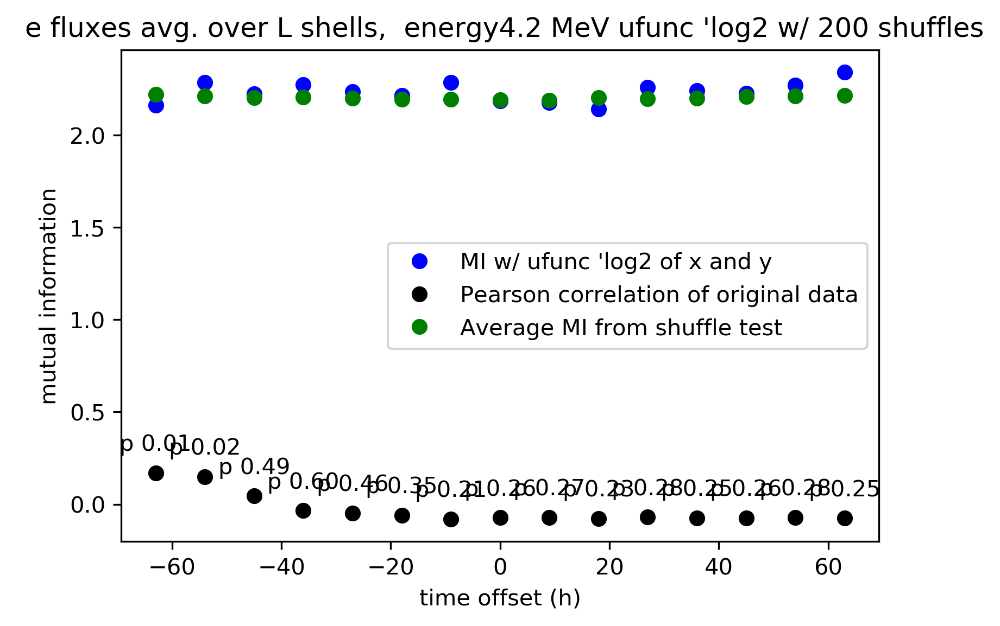

The average MI are


array([2.219726653283138 , 2.2111740233390407, 2.202684833285747 ,
       2.2055690103100263, 2.1986672280168698, 2.192087005367047 ,
       2.1919467684947516, 2.1891004276726536, 2.1882458405649974,
       2.2010564740733845, 2.1959490110689464, 2.2000051018105022,
       2.2071880042234526, 2.2115458549866758, 2.2139803621116543])

In [4]:
def _old_mi_shuffle(nruns,ufunc):
    file1="Raw_data/eflux_90d/ULF_wave_power_GOES15_2015-03-17_90d.txt"
    file2="Raw_data/eflux_90d/FESA_binned_eflux_4.2MeV_2015-03-17_90d.txt"
    shells,fluxes,f2=readerFESA(file2)
    ulf,f1=readerULF(file1)
    dates=ulf['dates']
    power=ulf['power']
    tau=7
    test=My_MI(f1,dates,power,f2,shells,fluxes)
    corrs=np.empty([2*tau+1,2]) #Array tp store correlation and p values
    #mymi=test._mutualinfo(test.power,test.avg_flux)
    #mymitoff=test._mi_toff_corr(test.power,test.avg_flux,tau)
    
    runs=nruns
    shuffle=np.empty([runs,2*tau+1])
    transfn=transf_name(ufunc)
    
    #Below the data are "logged", also the average fluxes
    for jj in range(runs):
        print("Run "+str(jj))
        sflux=shuffler(ufunc(test.avg_flux))
        spwr=shuffler(ufunc(test.power))
        tt,shuffle[jj,:]=test._mi_toff(spwr,sflux,tau)
    shuffle=np.average(shuffle,0)
    
    #Calculate correlations btw. original data sets (no logging)
    for kk in range(2*tau+1):
        npwr,nflx,dummy=test._t_offset(test.power,test.avg_flux,-tau+kk)
        corrs[kk,:]=stats.pearsonr(npwr,nflx)
        #import pdb; pdb.set_trace()
    
    #Actual MI (time offset also stored) of logged data
    realtt,real_mi=test._mi_toff(ufunc(test.power),ufunc(test.avg_flux),tau)
    
    #plotting
    #tr_name=transf_name(trans)
    plt.plot(realtt,real_mi,"bo",label=str("MI w/ "+str(transfn)+" of x and y"))
    plt.plot(realtt,corrs[:,0],"ko",label=str("Pearson correlation of original data"))
    plt.plot(realtt,shuffle,"go",label=str("Average MI from shuffle test"))
    annot(realtt,corrs[:,0],corrs[:,1],"p") #Annotate p values to the correlations 
    plt.legend(loc='right')
    plt.xlabel('time offset (h)')
    plt.ylabel('mutual information')
    enrg=test.energy
    plt.title(str(" e fluxes avg. over L shells, "+" energy"+enrg+" MeV "+str(transfn)+" w/ "+str(nruns)+" shuffles"))
    #print(info[6])
    #figname="MI_avg_L_shell_"+enrg+"MeV"+str(nruns)+"shuffles"
    #plt.savefig(figname+".pdf",format="pdf")
    plt.show()
    
    print("The average MI are")
    return shuffle
old_mi_shuffle(200,np.log2)

In [17]:
def data_gaussian(nruns,ufunc):
    mu = 0
    variance = 1
    sigma = np.sqrt(variance)
    
    file1="Raw_data/eflux_90d/ULF_wave_power_GOES15_2015-03-17_90d.txt"
    file2="Raw_data/eflux_90d/FESA_binned_eflux_4.2MeV_2015-03-17_90d.txt"
    shells,fluxes,f2=readerFESA(file2)
    ulf,f1=readerULF(file1)
    dates=ulf['dates']
    power=ulf['power']
    #tau=7
    test=My_MI(f1,dates,power,f2,shells,fluxes)
    
    #To store average mi of power/flux and the Gaussian
    avgmipwr=0
    avgmiflx=0
    avgcorrp=0
    avgcorrf=0
    
    for ii in range(nruns):
        avgmipwr=avgmipwr/nruns
        lpwr=len(test.power)
        lflx=len(test.avg_flux)
        xpwr = np.random.normal(mu, sigma, lpwr)
        xflx = np.random.normal(mu, sigma, lflx)
        mipwr=test._mutualinfo(ufunc(test.power),xpwr)
        miflx=test._mutualinfo(ufunc(test.avg_flux),xflx)
        avgmipwr=avgmipwr+mipwr
        avgmiflx=avgmiflx+miflx
        avgcorrp=avgcorrp+stats.pearsonr(test.power,xpwr)[0]
        avgcorrf=avgcorrf+stats.pearsonr(test.avg_flux,xflx)[0]
    avgmipwr=avgmipwr/nruns
    avgmiflx=avgmiflx/nruns 
    avgcorrp=avgcorrp/nruns
    avgcorrf=avgcorrf/nruns
    print("Did "+str(nruns)+" runs")
    print("Avg. MI btw. Gaussian and ULF "+str(avgmipwr))
    print("Avg. MI btw. Gaussian and "+test.energy+" MeV FESA avg flux"+str(avgmiflx))
    print("Avg. correlation btw. Gaussian and ULF "+str(avgcorrp))
    print("Avg. correlation btw. Gaussian and "+test.energy+" MeV FESA avg flux"+str(avgcorrf))


Did 10 runs
Avg. MI btw. Gaussian and ULF 0.03957596650448401
Avg. MI btw. Gaussian and 4.2 MeV FESA avg flux0.21484978168029278
Avg. correlation btw. Gaussian and ULF -0.0004996654465884404
Avg. correlation btw. Gaussian and 4.2 MeV FESA avg flux0.02794279786615799
Did 100 runs
Avg. MI btw. Gaussian and ULF 0.00386793928638091
Avg. MI btw. Gaussian and 4.2 MeV FESA avg flux0.20871098923502437
Avg. correlation btw. Gaussian and ULF 0.00782121433493236
Avg. correlation btw. Gaussian and 4.2 MeV FESA avg flux0.0013874309109785116
Did 1000 runs
Avg. MI btw. Gaussian and ULF 0.0004058022753288325
Avg. MI btw. Gaussian and 4.2 MeV FESA avg flux0.2173073162524812
Avg. correlation btw. Gaussian and ULF -0.0015174297675543556
Avg. correlation btw. Gaussian and 4.2 MeV FESA avg flux0.0010650900815121793
Did 10 runs
Avg. MI btw. Gaussian and ULF 0.05103164010852053
Avg. MI btw. Gaussian and 4.2 MeV FESA avg flux0.2102364461894138
Avg. correlation btw. Gaussian and ULF -0.03787602217171186
Avg. c

In [ ]:
data_gaussian(10,np.log2)
data_gaussian(100,np.log2)
data_gaussian(1000,np.log2)
data_gaussian(10,np.log2)
data_gaussian(100,np.log2)
data_gaussian(1000,np.log2)
data_gaussian(10,np.log2)
data_gaussian(100,np.log2)
data_gaussian(1000,np.log2)
#data_gaussian(10000,np.log2)

In [30]:
def gauss_shuffle(sample,nruns):
    #####This code reproduces the mutual information correctly for the Gaussians, when nruns=1
    mean=[0,0]
    #print(len(corr)," iterations")
    corr=np.linspace(0.001,0.999,100)
    misp=np.empty([len(corr),2])
    misf=np.empty([len(corr),2])
    errors=np.empty([len(corr),nruns])
    #for absolute values of kurtosis and skewness
    kurt1=[]
    skew1=[]
    #for test results from kurtiosis and skewness tests
    skews=[]
    kurts=[]
    pskews=[]
    pkurts=[]
    
    for jj in range(len(corr)):
        mip=[]
        mif=[]
        ci=corr[jj]
        corr_mat= np.array([[1.0, ci],
                        [ci, 1.0,]])
        x,y=np.random.multivariate_normal(mean,corr_mat,sample).T  
        for ii in range(nruns):    
            test=My_MI("dummy1",1,x,"dummy2",2,y)
            sx=shuffler(test.power)
            sy=shuffler(test.fluxes)       
            mip.append(test._mutualinfo(sx,test.fluxes))
            mif.append(test._mutualinfo(test.power,sy))
            #mip.append(test._mutualinfo(test.power,test.fluxes))
            #mif.append(test._mutualinfo(test.power,test.fluxes))
        #Test for the normality of the error
        #import pdb; pdb.set_trace()
        test2=My_MI("dummy1",1,mip,"dummy2",2,mif)   
        kurt1.append(scipy.stats.kurtosis(test2.power,fisher=False))
        skew1.append(scipy.stats.skew(test2.power))
        kurts.append(scipy.stats.kurtosistest(test2.power)[0])
        pkurts.append(scipy.stats.kurtosistest(test2.power)[1])
        skews.append(scipy.stats.skewtest(test2.power)[0])
        pskews.append(scipy.stats.skewtest(test2.power)[1])
                
        #calculate average MI and variance for given correlation
        avgp=np.mean(mip,dtype=np.float64)
        avgf=np.mean(mif,dtype=np.float64)
        varp=np.var(mip,dtype=np.float64)
        varf=np.var(mif,dtype=np.float64)
        #save the mean and variance for jj for plotting
        misp[jj,:]=np.array([avgp,varp])
        misf[jj,:]=np.array([avgf,varf])
    #calculate standard deviations
    sigp=np.sqrt(misp[:,1])
    sigf=np.sqrt(misf[:,1])
    #plot
    nsig=3
    plt.plot(corr**2,misp[:,0],label="Shuffled x, y not shuffled, "+str(nsig)+" sigma conf. interval")
    plt.plot(corr**2,misf[:,0],label="Shuffled y, x not shuffled, " +str(nsig)+" sigma conf. interval")
    plt.fill_between(corr**2,misp[:,0]-nsig*sigp, misp[:,0]+nsig*sigp, color='b', alpha=.1)
    plt.fill_between(corr**2,misf[:,0]-nsig*sigf, misf[:,0]+nsig*sigf, color='orange', alpha=.1)
    figname=str("Grvs: mean=0, var.=1; average MI, sample ="+str(sample)+", "+str(nruns)+" shuffles")
    plt.title(figname)
    plt.ylabel("mutual information (bits)")
    plt.xlabel("correlation squared")
    plt.legend()
    plt.savefig(figname+".pdf",format="pdf")
    plt.show()
    
    #print(sigp)
    #print the kurtosis and the skewness of the errors
    kurt1=np.asarray(kurt1)
    skew1=np.asarray(skew1)
    kurts=np.asarray(kurts)
    skews=np.asarray(skews)
    pkurts=np.asarray(pkurts)
    pskews=np.asarray(pskews)
    corr_interval=(0.999-0.001)/99
    print("Kurtosis test z scores")
    print(kurts[pkurts<0.05])
    print("Correlations for kurtosis with p<0.05")
    print(np.asarray(np.where(pkurts<0.05))*corr_interval)
    print("The corresponding absolute values of kurtosis")
    print(kurt1[pkurts<0.05])
    #print(pkurts)
    print("Skewness test z scores")
    print(skews[pskews<0.05])
    print("Correlations for skewness with p<0.05")
    print(np.asarray(np.where(pskews<0.05))*corr_interval)
    print("The corresponding absolute values of skewness")
    print(skew1[pskews<0.05])
    #print(pskews)

/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


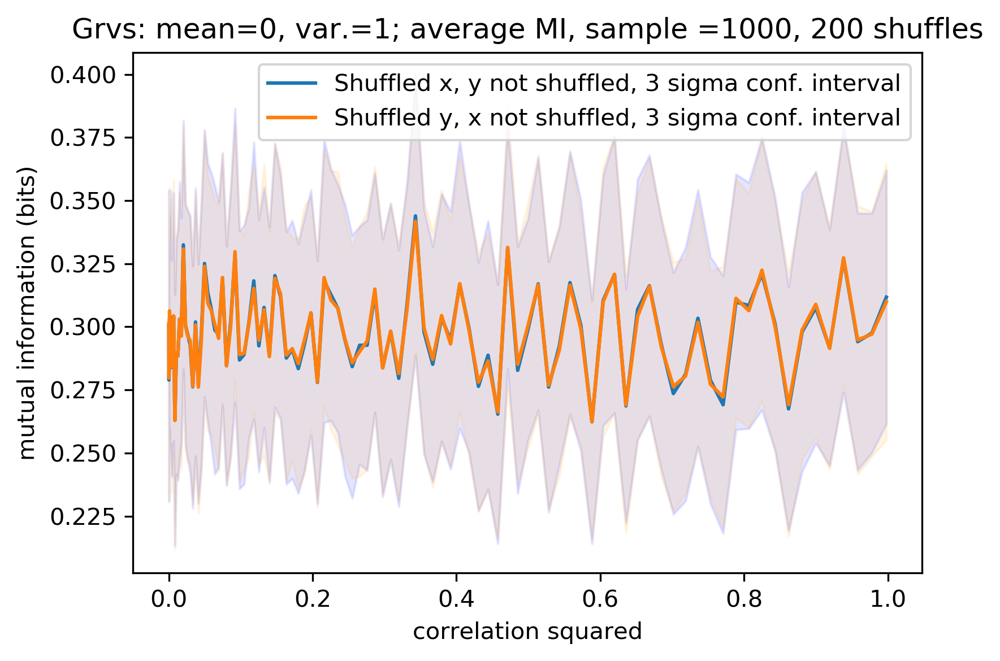

Kurtosis test z scores
[ 3.00115917 -2.22073985  2.39723547  1.98549254  1.9616466 ]
Correlations for kurtosis with p<0.05
[[ 0.11088889  0.42339394  0.64517172  0.88711111  0.92743434]]
The corresponding absolute values of kurtosis
[ 4.47498591  2.41161284  4.02477786  3.76895935  3.75523   ]
Skewness test z scores
[ 2.67767082  2.26624529  2.44999321  2.00130024  2.00076159  2.90188358
  2.11671663  2.29577823 -1.97324319  2.10507019  2.49819674  2.53482667
  2.30849799  2.66554001  3.36660238]
Correlations for skewness with p<0.05
[[ 0.02016162  0.05040404  0.10080808  0.11088889  0.19153535  0.20161616
   0.22177778  0.27218182  0.33266667  0.34274747  0.64517172  0.70565657
   0.77622222  0.86694949  0.92743434]]
The corresponding absolute values of skewness
[ 0.46879392  0.39179687  0.42584646  0.34356859  0.34347151  0.51198355
  0.36445865  0.39723471 -0.33851684  0.36234254  0.43486691  0.44174701
  0.39958079  0.46648328  0.60468947]


In [32]:
gauss_shuffle(1000,200)

/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


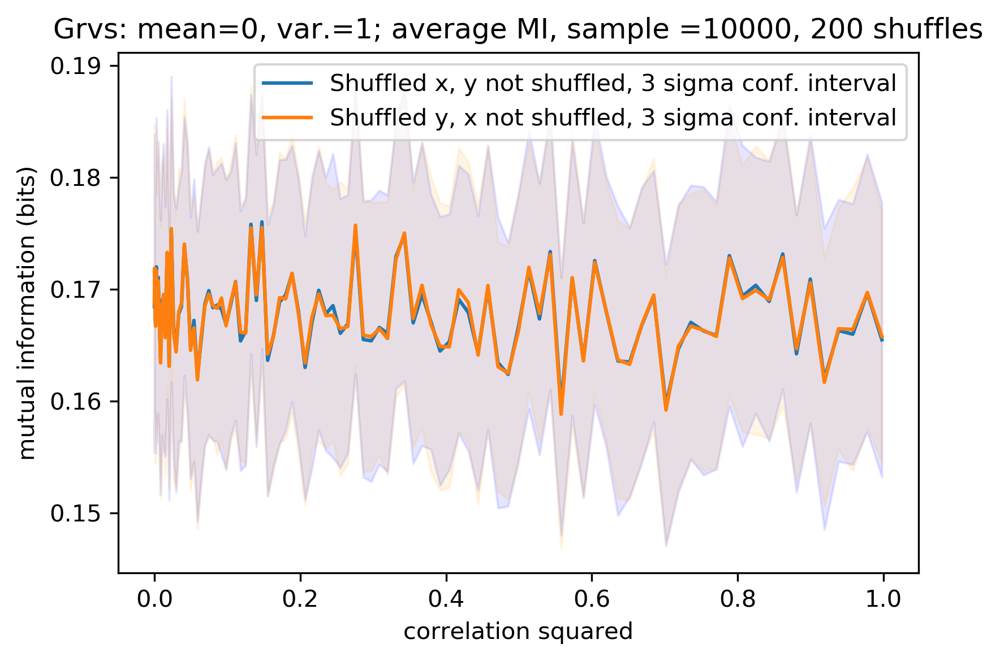

Kurtosis test z scores
[-2.05101253  2.52457313  3.29484268  2.64287726 -1.99662302]
Correlations for kurtosis with p<0.05
[[ 0.02016162  0.04032323  0.4939596   0.54436364  0.77622222]]
The corresponding absolute values of kurtosis
[ 2.44096107  4.11168705  4.73318276  4.1960624   2.45063616]
Skewness test z scores
[-2.42036772  2.33438683  2.32991472  3.15715154  2.30335142  2.64030486
 -2.26928939 -1.96764176]
Correlations for skewness with p<0.05
[[ 0.19153535  0.24193939  0.45363636  0.4939596   0.54436364  0.75606061
   0.83670707  0.94759596]]
The corresponding absolute values of skewness
[-0.42032114  0.40436338  0.40353649  0.56234229  0.39863124  0.46168483
 -0.39235677 -0.33750949]


In [33]:
gauss_shuffle(10000,200)

In [12]:
avga=[0,0,0,0]
for ii in range(1000):    
    a=shuffler([1,2,3,4])
    avga=avga+a
print(avga/1000)

[2.517 2.449 2.54  2.494]


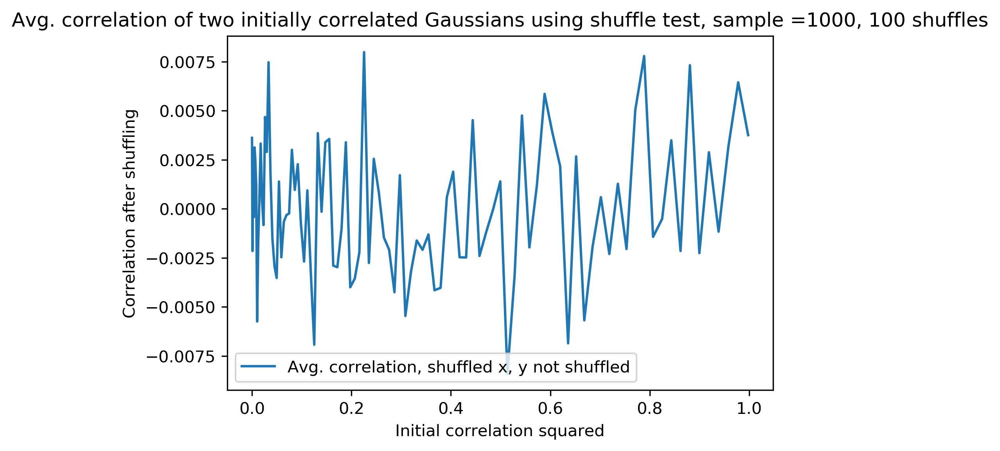

In [15]:
def avg_corr(sample,nruns):
    #Calculate the average correlation btw. shuffled Gaussians that are initially
    #correlated and one of them is then randomly shuffled
    mean=[0,0]
    #print(len(corr)," iterations")
    corr=np.linspace(0.001,0.999,100)
    misp=np.empty([len(corr),2])
    misf=np.empty([len(corr),2])
    avg_c=np.zeros(len(corr))
    for jj in range(len(corr)):
        mip=[]
        mif=[]
        ci=corr[jj]
        corr_mat= np.array([[1.0, ci],
                        [ci, 1.0,]])
        x,y=np.random.multivariate_normal(mean,corr_mat,sample).T  
        cc=0
        for ii in range(len(avg_c)):
            nx=shuffler(x)
            cc=cc+stats.pearsonr(nx,y)[0]
        avg_c[jj]=cc/nruns 
        
    plt.plot(corr**2,avg_c,label="Avg. correlation, shuffled x, y not shuffled")
    figname=str("Avg. correlation of two initially correlated Gaussians using shuffle test, sample ="+str(sample)+", "+str(nruns)+" shuffles")
    plt.title(figname)
    plt.ylabel("Correlation after shuffling")
    plt.xlabel("Initial correlation squared")
    plt.legend()
    plt.savefig(figname+".pdf",format="pdf")
    plt.show()
avg_corr(1000,100)

In [19]:
def gauss_test_mi_entropy(nruns,sample,varx,vary,cov):
    #To show that variance affects the entropies but doesn't effect the MI of two G.R.V.s
    mean=[0,0]
    #corr=np.linspace(0.001,0.999,100)
    #misp=np.empty([len(corr),2])
    #misf=np.empty([len(corr),2])
    avgentp=[]
    avgentf=[]
    #for jj in range(len(corr)):
    mip=[]
    #mif=[]
    #ci=corr[jj]
    corr_mat= np.array([[varx, cov],
                        [cov, vary,]])
    for ii in range(nruns):    
        #Choose a uniform distribution or a gaussian one
        x=np.random.uniform(low=varx,high=vary,size=sample)#create uniform distributions
        y=np.random.uniform(low=varx,high=vary,size=sample)
        #import pdb; pdb.set_trace()
        #x,y=np.random.multivariate_normal(mean,corr_mat,sample).T  #create Gaussian distributions
        
        
        test=My_MI("dummy1",1,x,"dummy2",2,y)
        #sx=shuffler(test.power)
        #sy=shuffler(test.fluxes)       
        mip.append(test._mutualinfo(test.power,test.fluxes))
        avgentp.append(my_entropy(test._createpdf(test.power,s=0)))
        avgentf.append(my_entropy(test._createpdf(test.fluxes,s=0)))
        #mif.append(test._mutualinfo(test.power,sy))
            #mip.append(test._mutualinfo(test.power,test.fluxes))
            #mif.append(test._mutualinfo(test.power,test.fluxes))
    #print(avgentp)
    #print(avgentf)
    avgp=np.mean(mip,dtype=np.float64)
    avgentp=np.mean(avgentp,dtype=np.float64)
    avgentf=np.mean(avgentf,dtype=np.float64)
    #avgf=np.mean(mif,dtype=np.float64)
    #varp=np.var(mip,dtype=np.float64)
    #varf=np.var(mif,dtype=np.float64)
        #save the mean and variance for jj for plotting
    #misp[jj,:]=np.array([avgp,varp])
    #misf[jj,:]=np.array([avgf,varf])
    print("Covariance "+str(cov)+", varx = "+str(varx)+", var y = "+str(vary)+", "+str(nruns)+" runs, sample = "+str(sample))
    print("Average mutual information = "+str(avgp))
    print("Average entropy of x = "+str(avgentp))
    print("Average entropy of y = "+str(avgentf)+"\n")
#gauss_test_mi_entropy(100,100,50,1,0.5)
#gauss_test_mi_entropy(100,1000,10,0.5,0.5)
#gauss_test_mi_entropy(1000,10000,0.5,2,0.5)
#gauss_test_mi_entropy(1000,10000,5,1,0.5)
#gauss_test_mi_entropy(1000,10000,1,5,0.5)
#gauss_test_mi_entropy(1000,10000,5,5,0.5)

In [22]:
gauss_test_mi_entropy(100,10,0,1,0.2)
gauss_test_mi_entropy(100,100,0,2,0.2)
gauss_test_mi_entropy(100,1000,0,20000,0.2)
gauss_test_mi_entropy(100,1000,0,20,0.2)
gauss_test_mi_entropy(100,1000,-30,200,0.2)

Covariance 0.2, varx = 0, var y = 1, 100 runs, sample = 10
Average mutual information = 0.291725389123
Average entropy of x = 1.283872541
Average entropy of y = 1.33970626844

Covariance 0.2, varx = 0, var y = 2, 100 runs, sample = 100
Average mutual information = 0.136355557176
Average entropy of x = 2.34170269051
Average entropy of y = 2.32192509574

Covariance 0.2, varx = 0, var y = 20000, 100 runs, sample = 1000
Average mutual information = 0.0669194200619
Average entropy of x = 3.37651910694
Average entropy of y = 3.39286053396

Covariance 0.2, varx = 0, var y = 20, 100 runs, sample = 1000
Average mutual information = 0.064867056868
Average entropy of x = 3.37186494359
Average entropy of y = 3.38059042434

Covariance 0.2, varx = -30, var y = 200, 100 runs, sample = 1000
Average mutual information = 0.0654078898434
Average entropy of x = 3.37053606896
Average entropy of y = 3.39101594949



In [ ]:
Covariance 0.2, varx = 0, var y = 1, 100 runs, sample = 10
Average mutual information = 0.304325287331
Covariance 0.2, varx = 0, var y = 2, 100 runs, sample = 100
Average mutual information = 0.130375062086
Covariance 0.2, varx = 0, var y = 20000, 100 runs, sample = 1000
Average mutual information = 0.066355856205

In [6]:
def quick_test(n1,n2,ULFp,event=None):
    print(os.getcwd())
    new_e_fluxes,file2=readerEFLUX(n2)
    new_ULF,file1=readerVIRBO(n1)
    dummy1=1
    dummy2=2
    test=My_MI(file1,new_e_fluxes['doy'],new_ULF[ULFp],file2,dummy2,new_e_fluxes['Fe1p2'])
    #remove NaNs and big numbers that denote missing values
    ulf,fesa=test._remnans(test.power,test.fluxes)
    fesa,ulf=test._remnans(fesa,ulf)
    big=max(abs(fesa))+1
    ulf,fesa=test._rembig(ulf,fesa,big)
    fesa,ulf=test._rembig(fesa,ulf,big)
    #test.power=ulf
    #test.fluxes=fesa
    #test.dates=dates
    
    #calculate pdfs, MI and correlation
    print(str("ULF from file "+str(n1)))
    print(str("E fluxes from file "+str(n2)))
    pdfulf=test._createpdf(ulf,0,str(ULFp+" ULF"),"log 10 of power spectral density","probability mass (dimensionless)")
    pdfeflux=test._createpdf(fesa,0,"e flux","log 10 of e flux (flux in keV-1 cm-1 s-1 ster-1.)","probability mass (dimensionless)")
    mi=test._mutualinfo(ulf,fesa)
    corr,p=stats.pearsonr(ulf,fesa)
    Nruns=200
    miavg,misig,mivar=mi_shuffle(ulf,fesa,Nruns)
    #import pdb; pdb.set_trace()
    
    print("Mutual information = ",mi)
    print("Correlation = ",corr," with p =",p)
    print("Average MI = ",miavg)
    
    #Calculate and plot MI with time offset
    tau=24*1 
    tstep=1
    #import pdb; pdb.set_trace()
    nulf=test._big2nans(test.power,big)
    nfesa=test._big2nans(test.fluxes,big)
    toff,mioff=test._mi_toff(nulf,nfesa,tau,1,1,1,str(event+"_"+ULFp+"_w_time_offset"))
    
    #plot daily averaged measurement data on the same plot w/ two y axes
    avgstep=24
    print(str("Calculating averages in "+str(avgstep)+" hour steps"))
    daily_ulf=test._big2nans(test.power,big)
    daily_flux=test._big2nans(test.fluxes,big)
    daily_flux=hours_avg(daily_flux,avgstep)
    daily_ulf=hours_avg(daily_ulf,avgstep)
    corrdaily,pdaily=stats.pearsonr(daily_flux,daily_ulf)
    print(str("Correlation of daily averaged "+str(ULFp)+" ULF and e flux = "+str(round(corrdaily,3))+"w/ p = "+str(round(pdaily,5))))
    t=test.dates[::24]
    #import pdb; pdb.set_trace()
    fig, ax1 = plt.subplots()

    color = 'tab:blue'
    ax1.set_xlabel('day of year')
    ax1.set_ylabel('log 10 of'+str(ULFp)+' ULF', color=color)
    ax1.plot(t, daily_ulf, color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:orange'
    ax2.set_ylabel('log 10 of e flux', color=color)  # we already handled the x-label with ax1
    ax2.plot(t, daily_flux, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    #Currently manually change info in the title and txt
    avgttl=str(event+"_"+ULFp+"_daily_averages")
    plt.title(avgttl)
    txt=str("w/ 1 h resol.: MI = "+str(round(mi,3))+", (noise = "+str(round(miavg,3))+"\n"+"w/ sigma = "+str(round(misig,3))+" from "+str(Nruns)+" shuffles), \n"+"corr = "+str(round(corr,3))+" w/ p = "+str(round(p,5)))
    ax1.text(0.1, 0.15, txt, transform=ax1.transAxes, fontsize=8,
        verticalalignment='top')
    plt.savefig(str(avgttl+".pdf"),format="pdf")
    plt.show()
    
#quick_test("Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1994_Mar_May_90d_full.txt","Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1994_Mar_May_90d.txt",'Sgr',"1994_Mar_May_90d_1h_resol")

/Users/mikkosavola/Documents/Opiskelu_HY/Kandidaatintutkielma
Removed 0 'big' values
Removed 0 'big' values
ULF from file Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1994_Mar_May_90d_full.txt
E fluxes from file Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1994_Mar_May_90d.txt
Mutual information =  0.2149024642961906
Correlation =  0.08092356598315796  with p = 0.00015806008907868888
Average MI =  0.11998392852959348


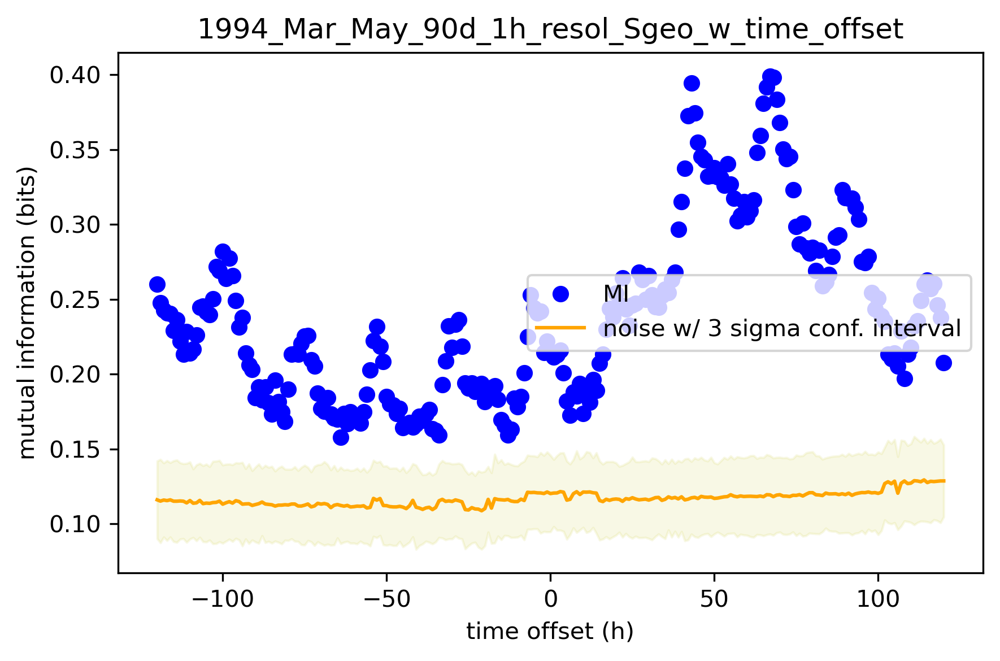

Calculating averages in 24 hour steps
Correlation of daily averaged Sgeo ULF and e flux = 0.132w/ p = 0.21371


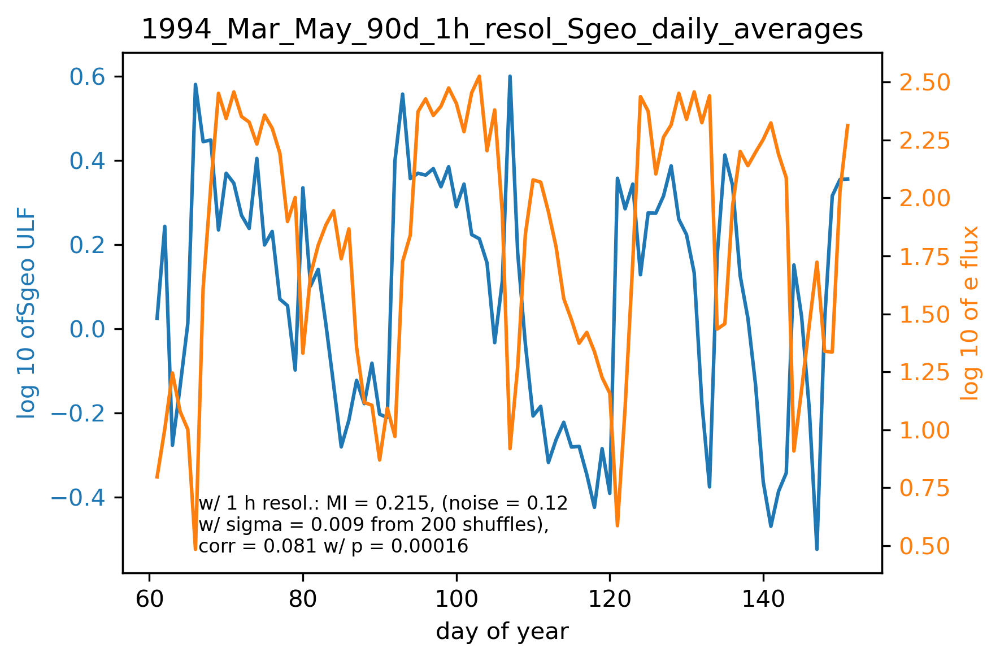

In [7]:
quick_test("Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1994_Mar_May_90d_full.txt","Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1994_Mar_May_90d.txt",'Sgeo',"1994_Mar_May_90d_1h_resol")

/Users/mikkosavola/Documents/Opiskelu_HY/Kandidaatintutkielma
Removed 0 'big' values
Removed 0 'big' values
ULF from file Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1994_Mar_May_90d_full.txt
E fluxes from file Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1994_Mar_May_90d.txt
Mutual information =  0.28873191277639076
Correlation =  0.2805926288009969  with p = 8.454470096670397e-41
Average MI =  0.13511394750693814


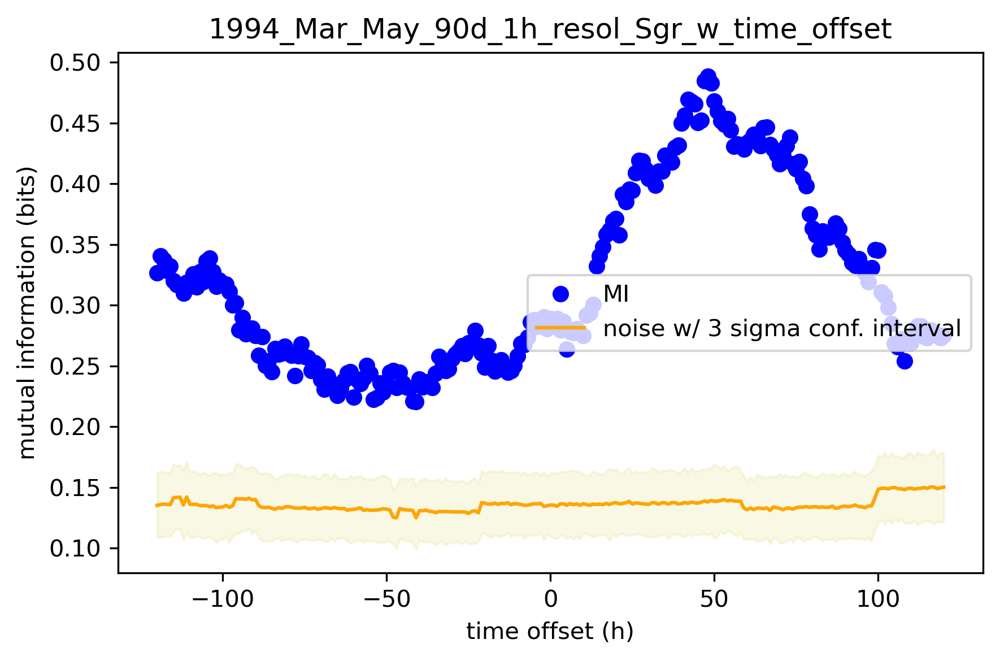

Calculating averages in 24 hour steps
Correlation of daily averaged Sgr ULF and e flux = 0.377w/ p = 0.00023


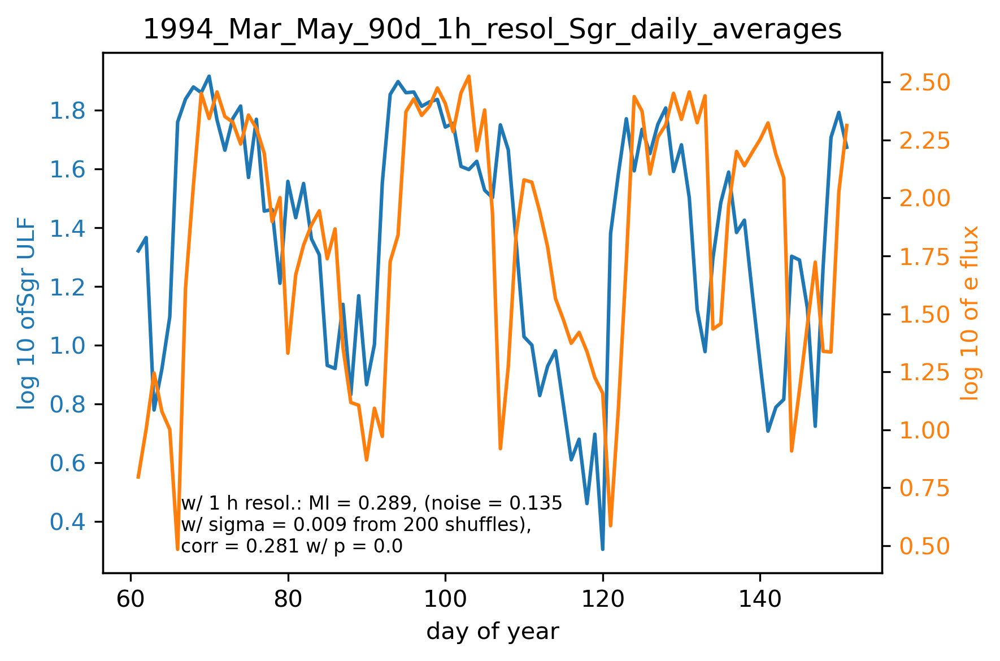

In [8]:
quick_test("Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1994_Mar_May_90d_full.txt","Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1994_Mar_May_90d.txt",'Sgr',"1994_Mar_May_90d_1h_resol")

/Users/mikkosavola/Documents/Opiskelu_HY/Kandidaatintutkielma
Removed 0 'big' values
Removed 0 'big' values
ULF from file Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1993_full.txt
E fluxes from file Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1993.txt
Mutual information =  0.27299195268744914
Correlation =  -0.19967321436597796  with p = 5.608680132989451e-07
Average MI =  0.17345555694601877


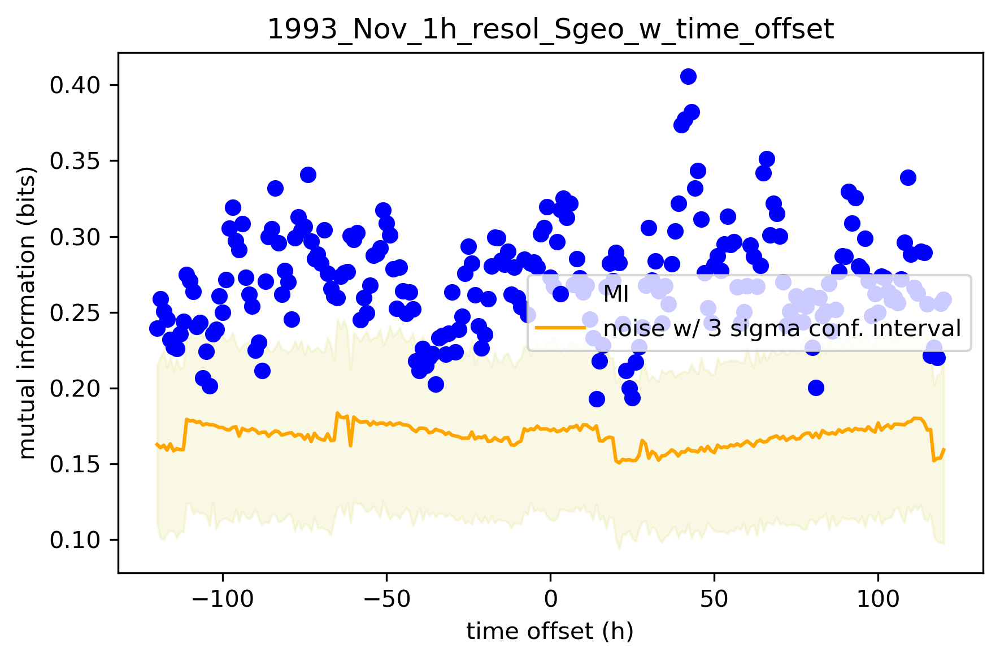

Calculating averages in 24 hour steps
Correlation of daily averaged Sgeo ULF and e flux = -0.272w/ p = 0.17908


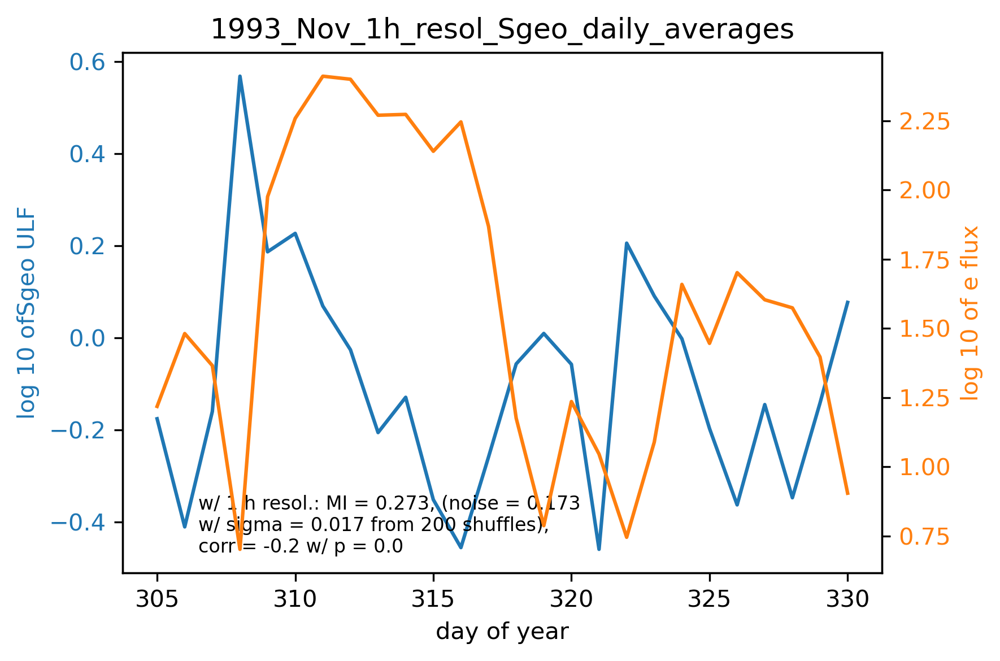

In [9]:
quick_test("Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1993_full.txt","Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1993.txt",'Sgeo',"1993_Nov_1h_resol")

/Users/mikkosavola/Documents/Opiskelu_HY/Kandidaatintutkielma
Removed 0 'big' values
Removed 0 'big' values
ULF from file Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1993_full.txt
E fluxes from file Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1993.txt
Mutual information =  0.2818171492109455
Correlation =  0.08695358746686291  with p = 0.029866246975864128
Average MI =  0.16456665827640238


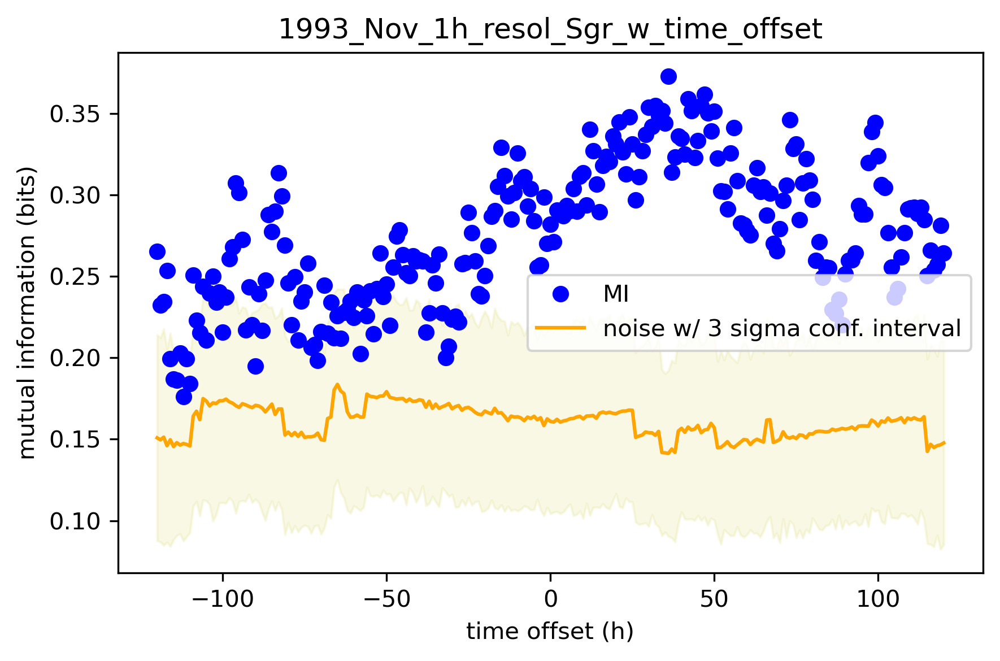

Calculating averages in 24 hour steps
Correlation of daily averaged Sgr ULF and e flux = 0.095w/ p = 0.6457


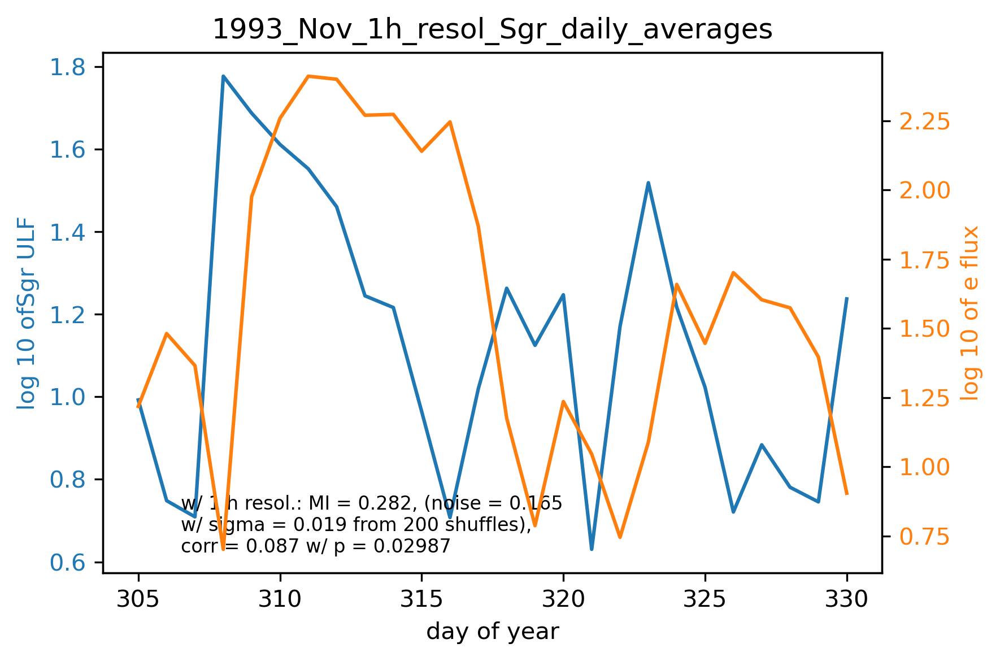

In [10]:
quick_test("Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1993_full.txt","Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1993.txt",'Sgr',"1993_Nov_1h_resol")

Removed 0 'big' values
Removed 0 'big' values
ULF from file Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1993_full.txt
E fluxes from file Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1993.txt
Mutual information =  0.2818171492109455
Correlation =  0.08695358746686291  with p = 0.029866246975864128
Average MI =  0.16082665795225168


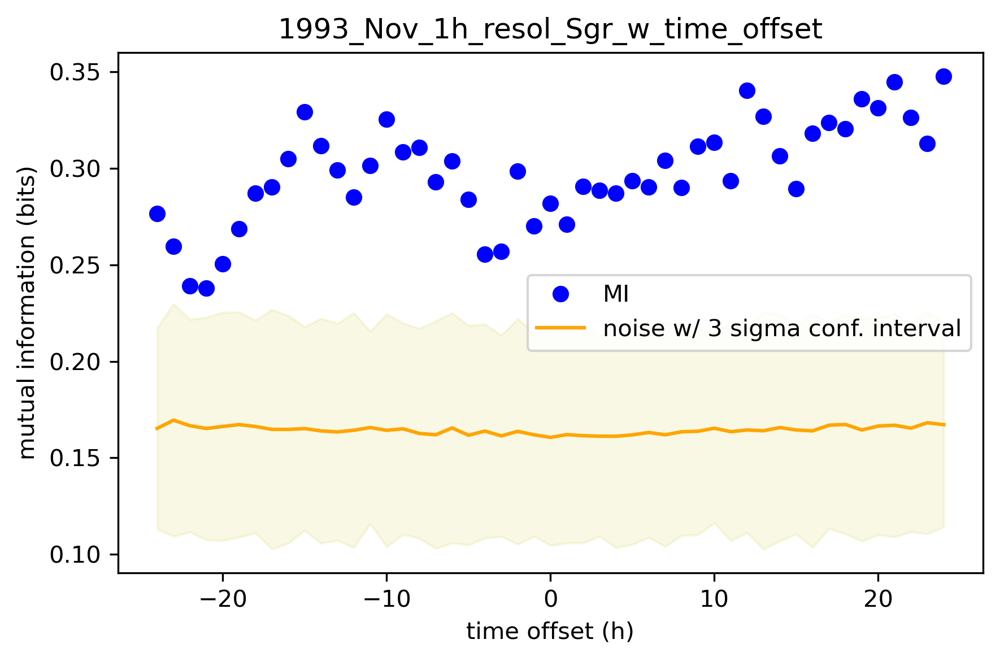

Calculating averages in 24 hour steps
Correlation of daily averaged Sgr ULF and e flux = 0.095w/ p = 0.6457


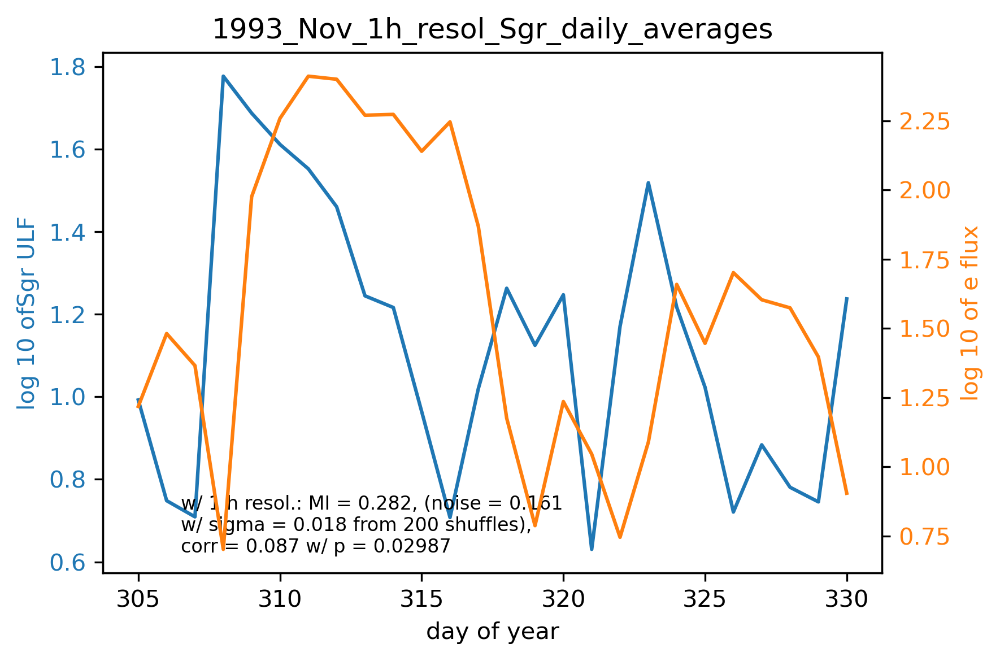

In [20]:
quick_test("Raw_data/ViRBO_Space_science/Rostoker_replication/1h_ViRBO_ULF_1993_full.txt","Raw_data/ViRBO_Space_science/Rostoker_replication/e_flux_1h_1993.txt",'Sgr',"1993_Nov_1h_resol")

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.265w/ p = 0.01113


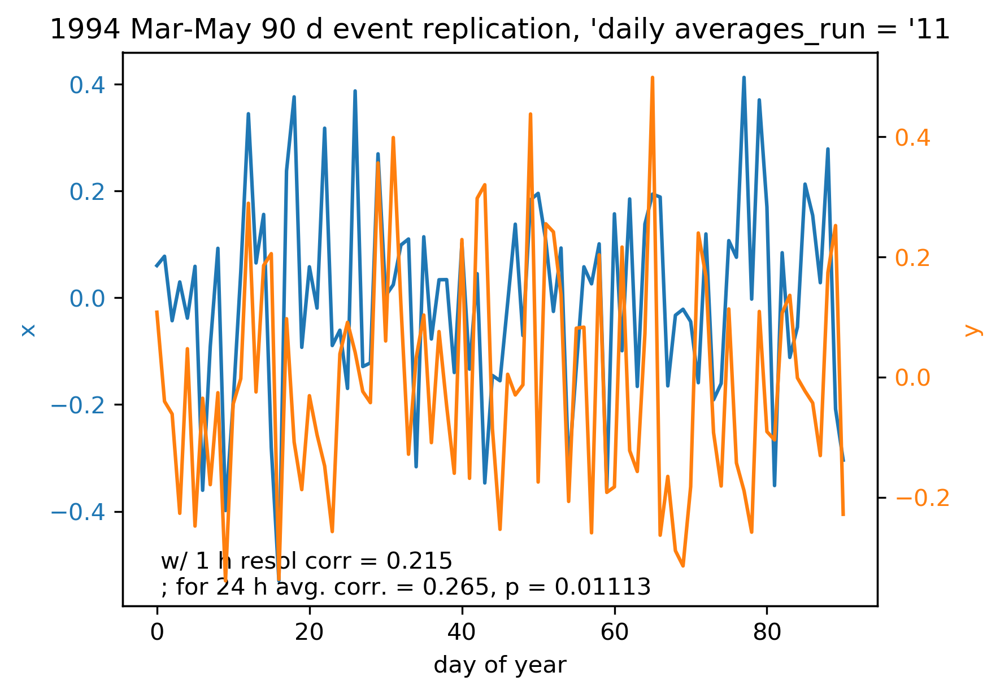

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.266w/ p = 0.01074


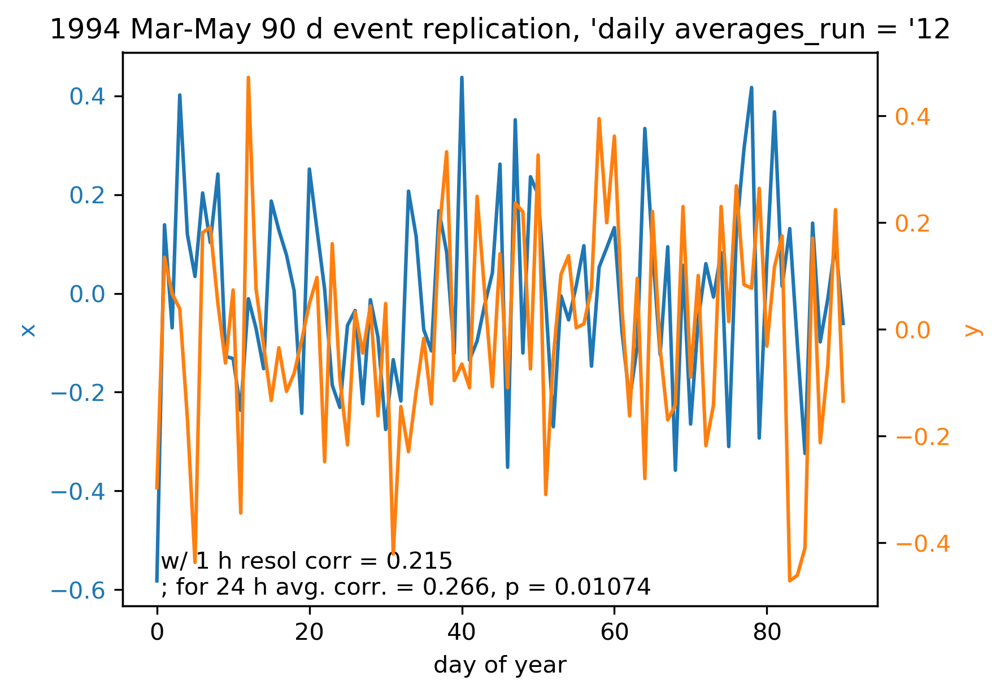

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.281w/ p = 0.00698


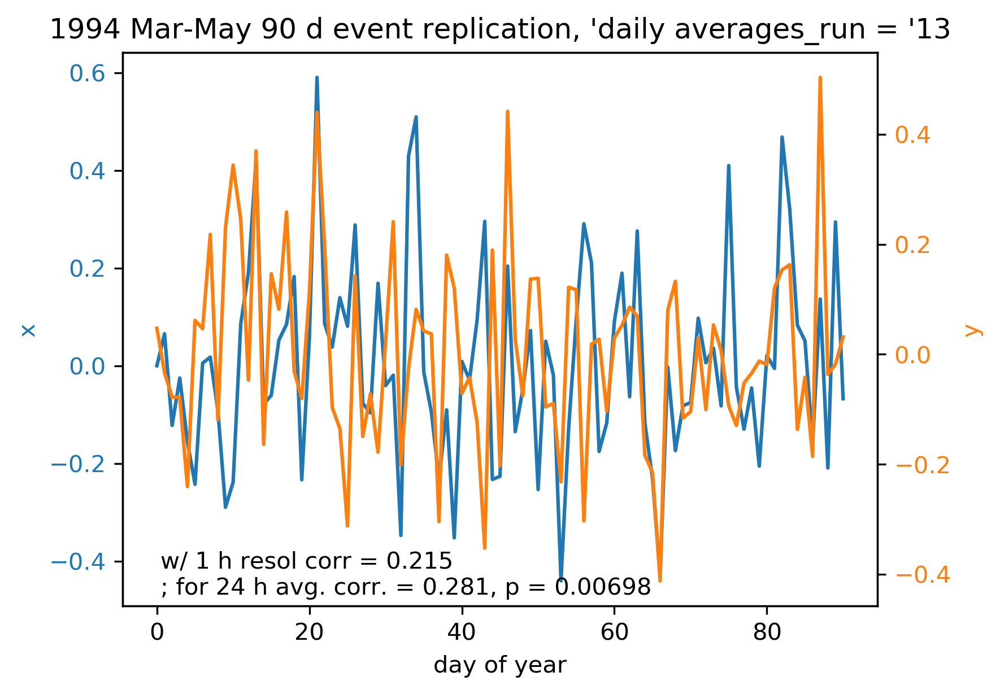

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.052w/ p = 0.62732


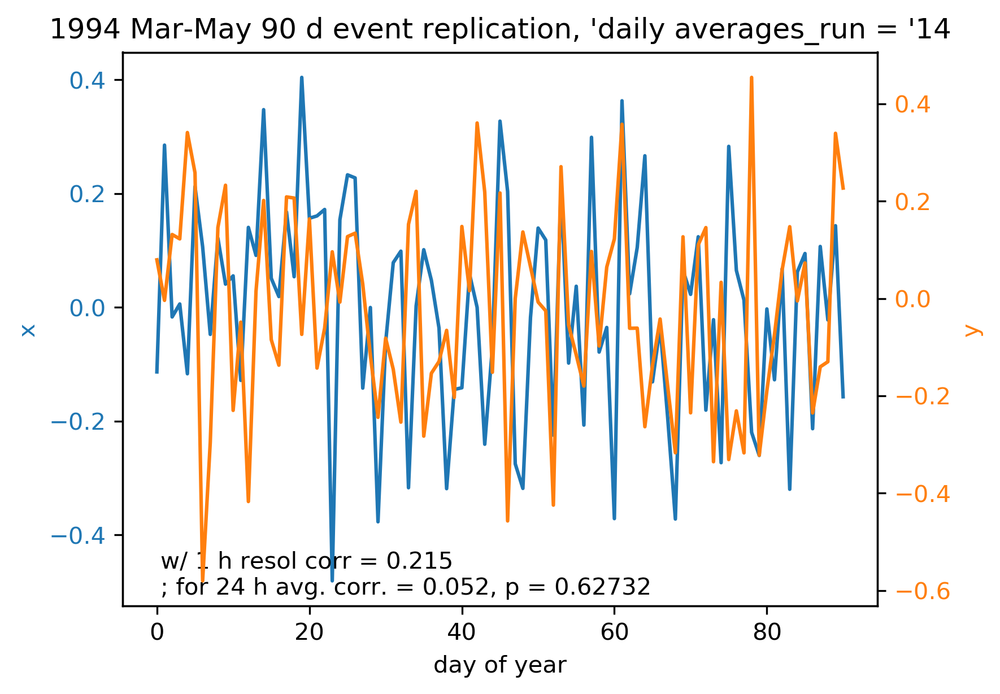

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.206w/ p = 0.04981


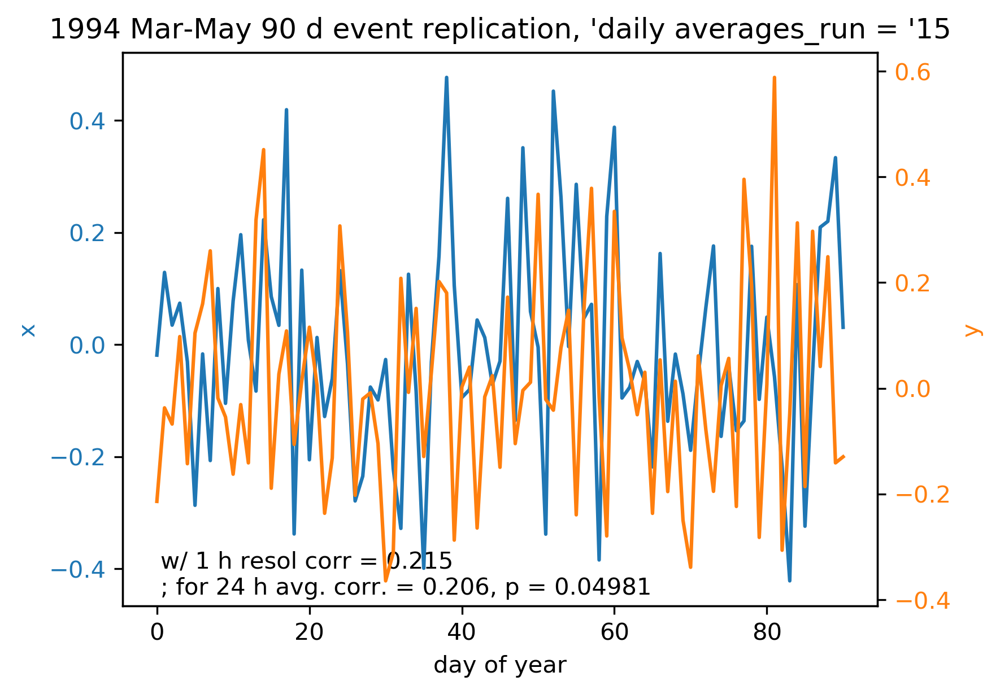

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.218w/ p = 0.038


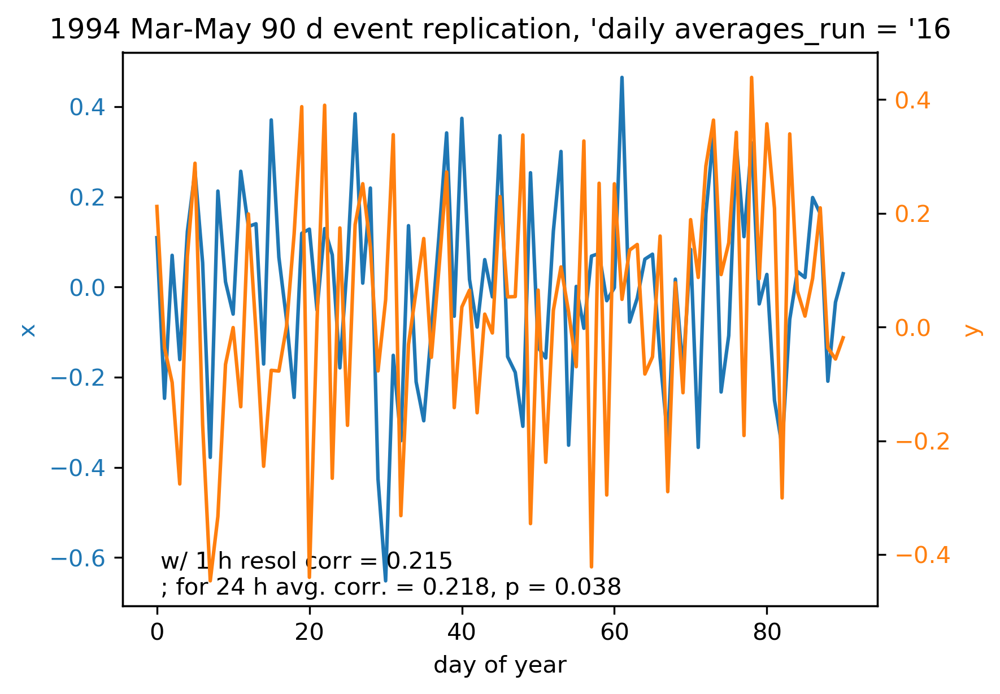

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.257w/ p = 0.01409


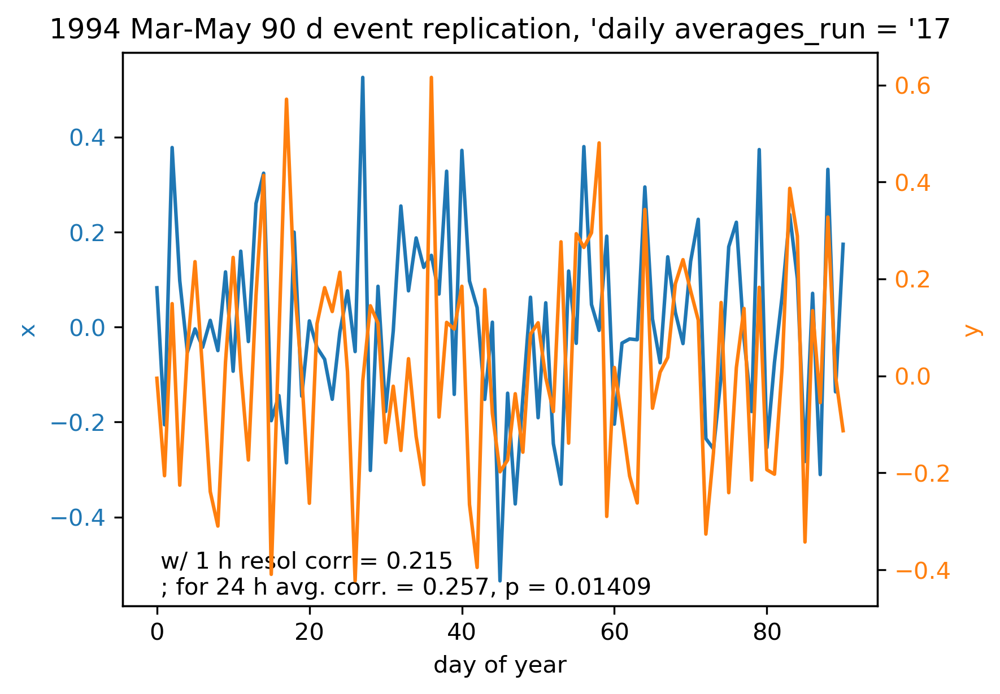

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.104w/ p = 0.32766


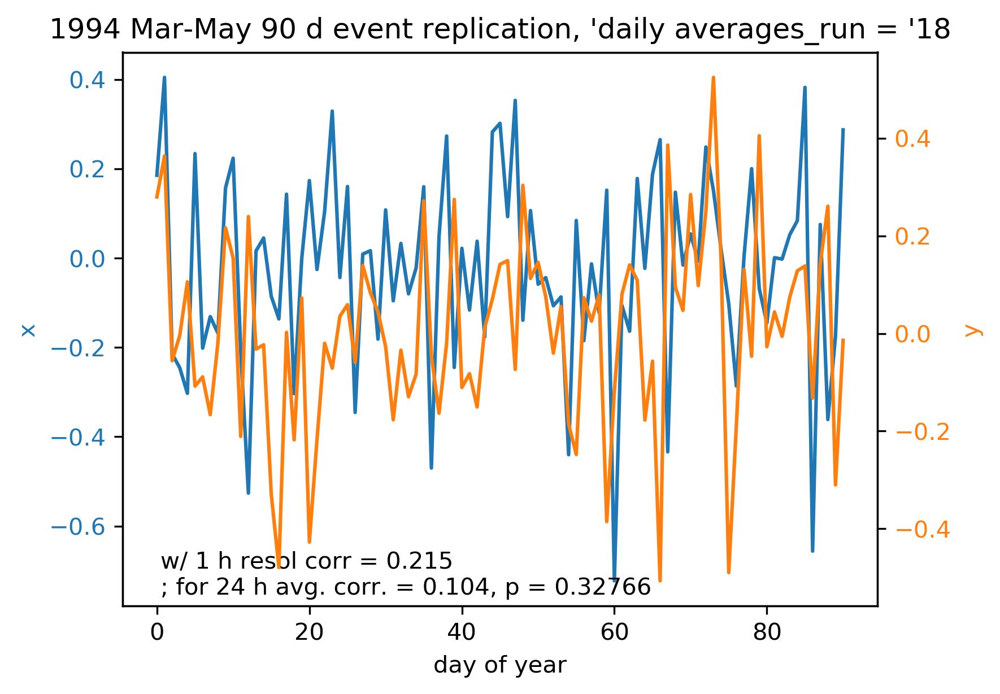

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.18w/ p = 0.08688


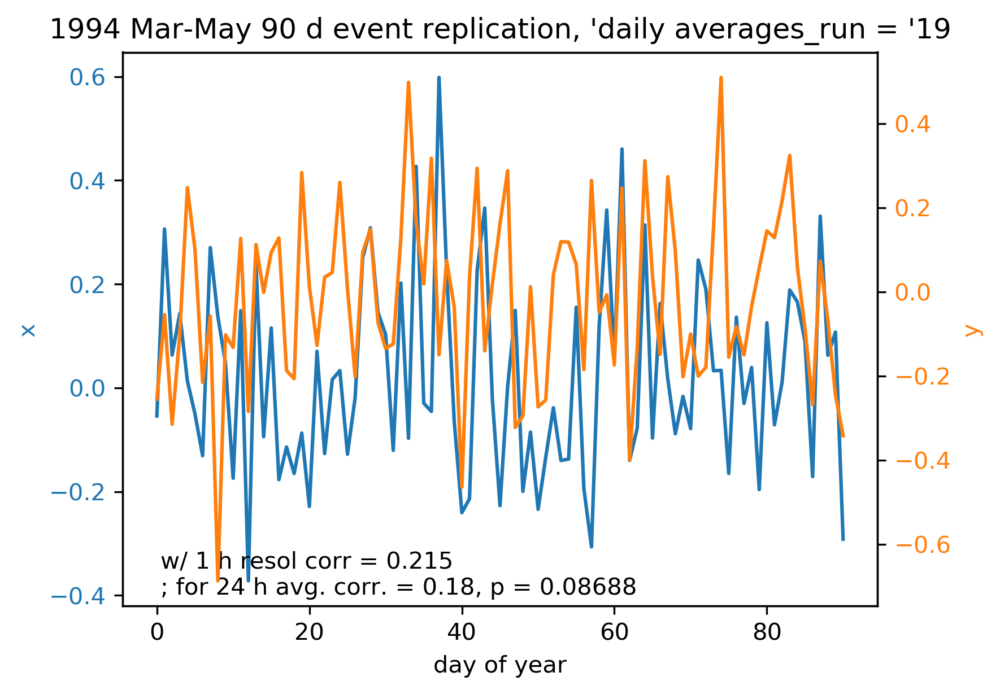

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.172w/ p = 0.10351


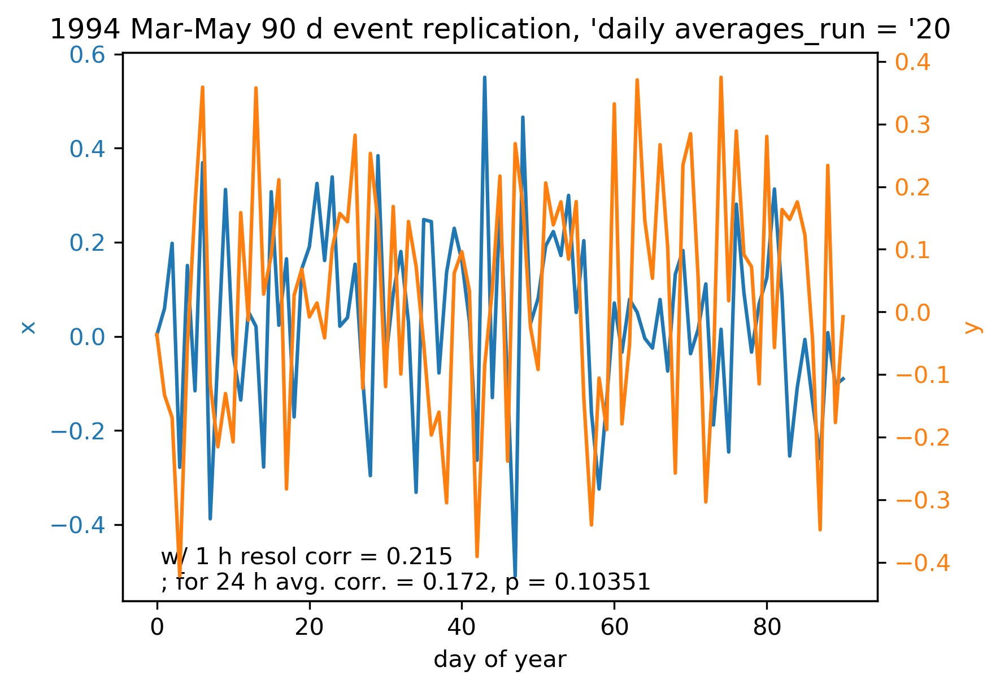

Calculating averages in 24 hour steps
Correlation of daily averaged GRVs = 0.298w/ p = 0.00416


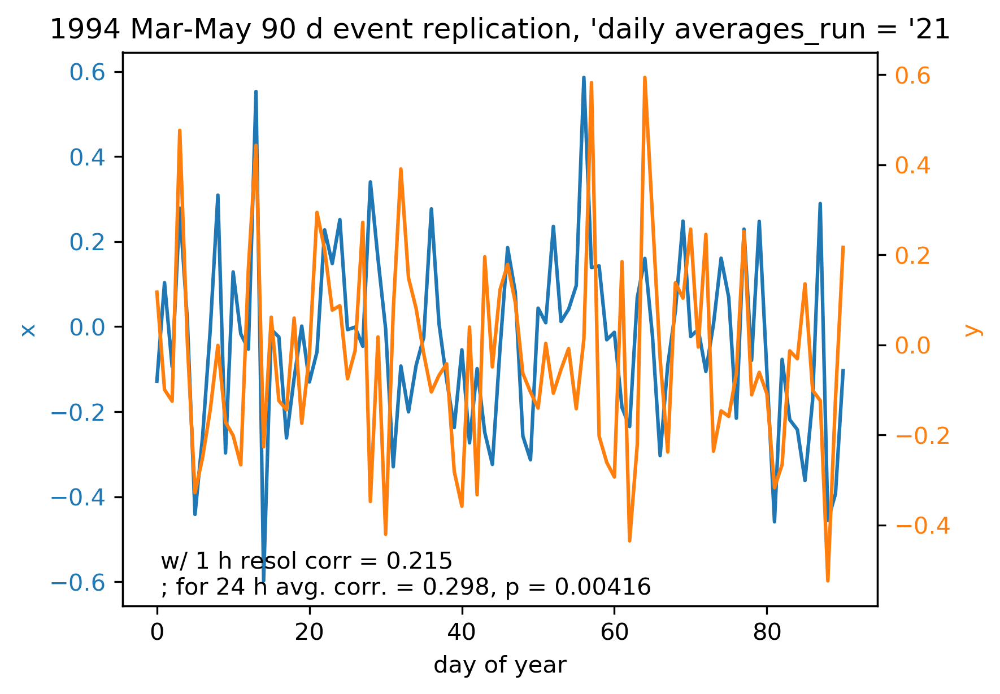

In [59]:
def rostoker_grv_replica(corr,interval,sample,event=None,nrun=None):
    #To replicate the "Rostoker event" from Mar 2nd - May 31st 1994 w/ GRVs that have the same correlation as the 1 h
    #data in the Rostoker events
    #corr is the correlation and interval is the time interval, over which time averages ara calculated
    #nruns is the number of runs, over whuichthe result is averaged
    mean=[0,0]
    varx=1
    vary=1
    avgmi=[]
    avgstep=interval
    #for jj in range(len(corr)):
    mip=[]
    #mif=[]
    #ci=corr[jj]
    corr_mat= np.array([[1, corr],
                        [corr, 1]])
    x,y=np.random.multivariate_normal(mean,corr_mat,sample).T  
    test=My_MI("dummy1",np.empty(sample),x,"dummy2",2,y)
    for ii in range(int(sample/avgstep)):    
        test.dates[ii*avgstep:(ii+1)*avgstep]=np.linspace(ii*avgstep,(ii+1)*avgstep,avgstep)
    #sx=shuffler(test.power)
    #sy=shuffler(test.fluxes)  
    
    #plot daily averaged measurement data on the same plot w/ two y axes
  
    print(str("Calculating averages in "+str(avgstep)+" hour steps"))
    daily_ulf=test.power
    daily_flux=test.fluxes
    daily_flux=hours_avg(daily_flux,avgstep)
    daily_ulf=hours_avg(daily_ulf,avgstep)
    corrdaily,pdaily=stats.pearsonr(daily_flux,daily_ulf)
    print(str("Correlation of daily averaged GRVs = "+str(round(corrdaily,3))+"w/ p = "+str(round(pdaily,5))))
    t=test.dates[::avgstep]/avgstep
    #import pdb; pdb.set_trace()
    fig, ax1 = plt.subplots()

    color = 'tab:blue'
    ax1.set_xlabel('day of year')
    ax1.set_ylabel('x', color=color)
    ax1.plot(t, daily_ulf, color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:orange'
    ax2.set_ylabel('y', color=color)  # we already handled the x-label with ax1
    ax2.plot(t, daily_flux, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    #Currently manually change info in the title and txt
    avgttl=str(event+", 'daily averages_run = '"+str(nrun))
    plt.title(avgttl)
    txt=str("w/ 1 h resol corr = "+str(corr)+"\n; for 24 h avg. corr. = "+str(round(corrdaily,3))+", p = "+str(round(pdaily,5)))
    ax1.text(0.05, 0.10, txt, transform=ax1.transAxes, fontsize=10,
        verticalalignment='top')
    plt.savefig(str(avgttl+".pdf"),format="pdf")
    plt.show()
    
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",1)
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",2)
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",3)
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",4)
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",5)
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",6)
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",7)
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",8)
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",9)
#rostoker_grv_replica(0.6,24,2184,"Test w initial corr.=0.6",10)


#rostoker_grv_replica(0.215,24,2184,"1993 Nov event replication",1)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",11)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",12)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",13)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",14)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",15)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",16)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",17)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",18)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",19)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",20)
rostoker_grv_replica(0.215,24,2184,"1994 Mar-May 90 d event replication",21)


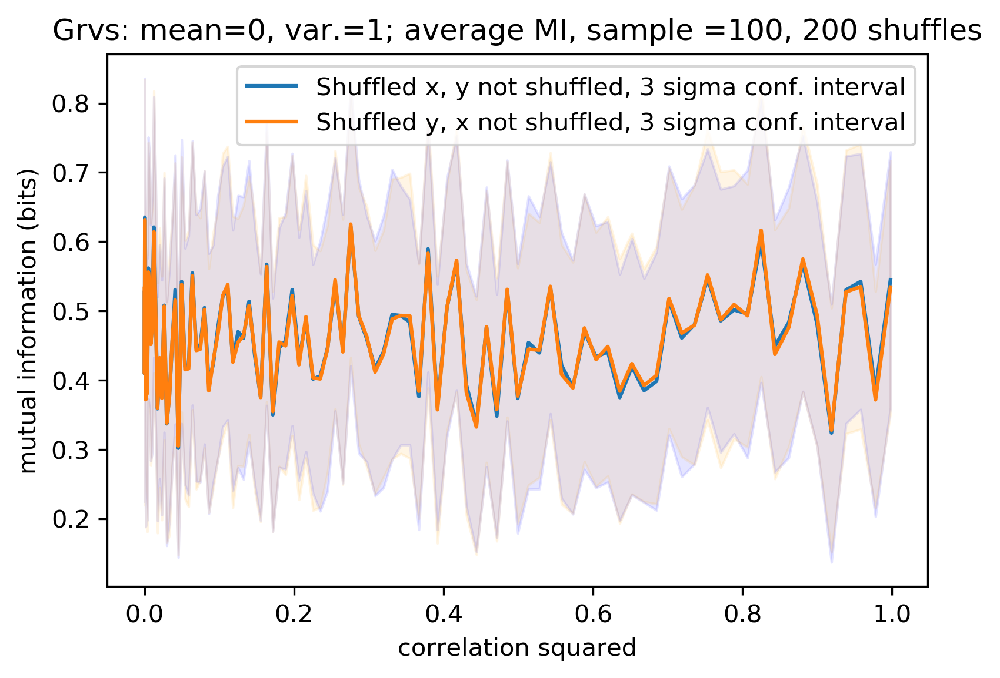

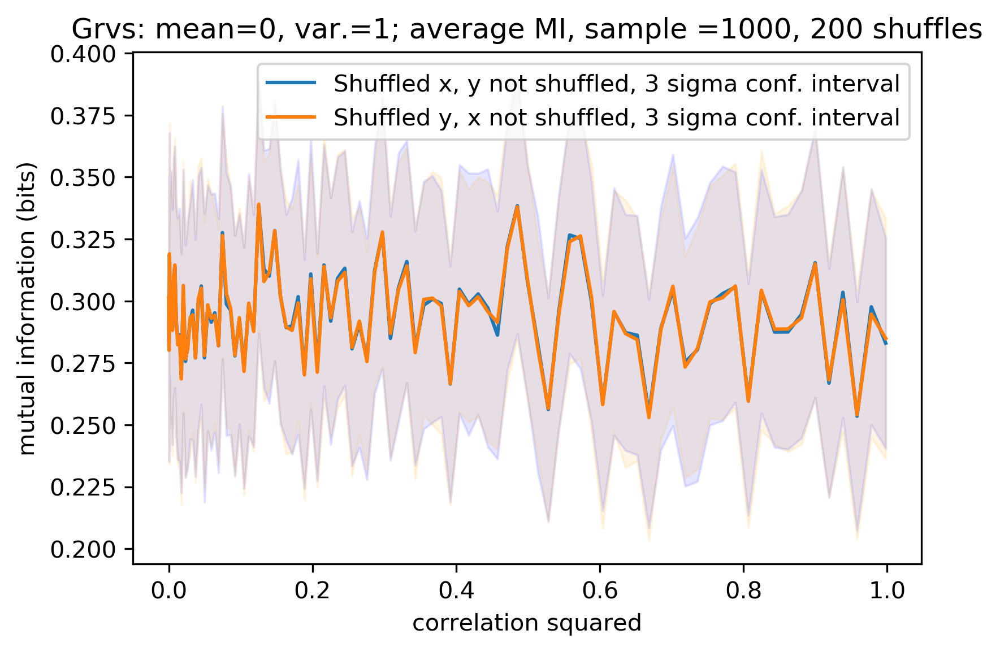

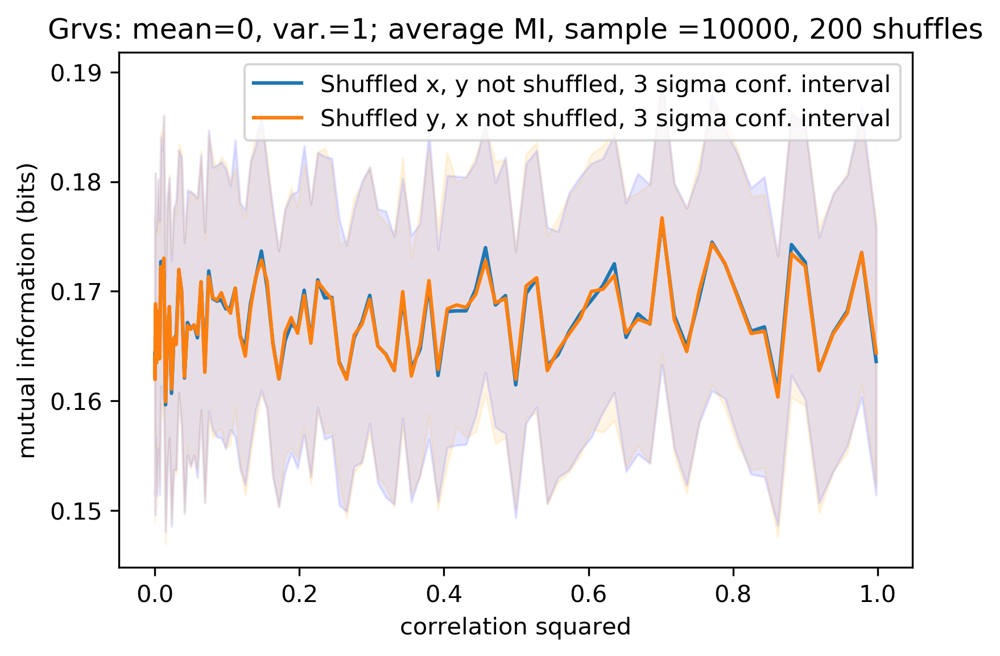

In [13]:
#Run these overnight
#test_transforms_my(np.log2,100,200)
#test_transforms_my(np.log2,1000,200)
#test_transforms_my(np.log2,10000,200)
gauss_shuffle(100,200)
#gauss_shuffle(1000,200)
#gauss_shuffle(10000,200)

In [32]:
a=[1,2,3,4,5,6,7,8,9]
print(a[-5:])

[5, 6, 7, 8, 9]


In [26]:
def rand_test(n):
    xx=np.random.rand(n,1)
    yy=np.random.rand(n,1)
    #print(xx)
    obj_test=My_MI("w",1,xx,"w",2,yy)
    print("MI =",str(obj_test._mutualinfo(xx,yy)))
    print("Average MI from 200 shuffles = ",str(mi_shuffle(xx,yy,200)[0]))
rand_test(1000)
rand_test(1000)
rand_test(1000)
rand_test(1000)
rand_test(1000)

MI = 0.06954541716028284
Average MI from 200 shuffles =  0.07550512339090944
MI = 0.05989675672123346
Average MI from 200 shuffles =  0.06725618805664428
MI = 0.05687180790402515
Average MI from 200 shuffles =  0.0745455646010367
MI = 0.06288845260299862
Average MI from 200 shuffles =  0.060671850082993875
MI = 0.050074397268365586
Average MI from 200 shuffles =  0.06561833162207023


In [27]:
rand_test(10000)
rand_test(10000)
rand_test(10000)
rand_test(10000)
rand_test(10000)

MI = 0.0307125106712368
Average MI from 200 shuffles =  0.032159007413479095
MI = 0.030187303268521464
Average MI from 200 shuffles =  0.03185855248079225
MI = 0.031936070974970074
Average MI from 200 shuffles =  0.03194303094435548
MI = 0.035177118709013494
Average MI from 200 shuffles =  0.03210720920105801
MI = 0.03152929595893766
Average MI from 200 shuffles =  0.03198762085829216
